<div style="background: #000;
            color: #FFF;
            margin: 0px;
            margin-bottom: 10px;
            padding: 10px 0px 20px 0px;
            text-align: center; 
                ">
    <h1>Week 34 Class 2</h1> 
    <h3>05/25/21</h3>
</div>

## Objectives for this week:
* Review Week

## Todays Agenda
* Review



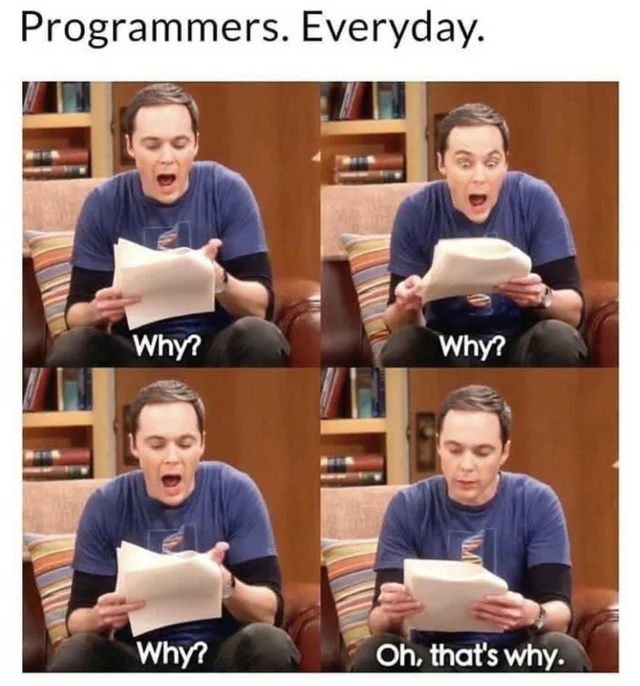

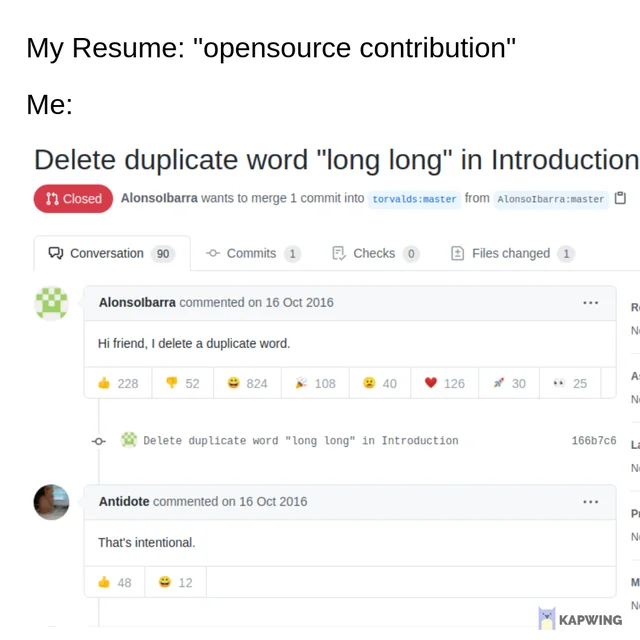 
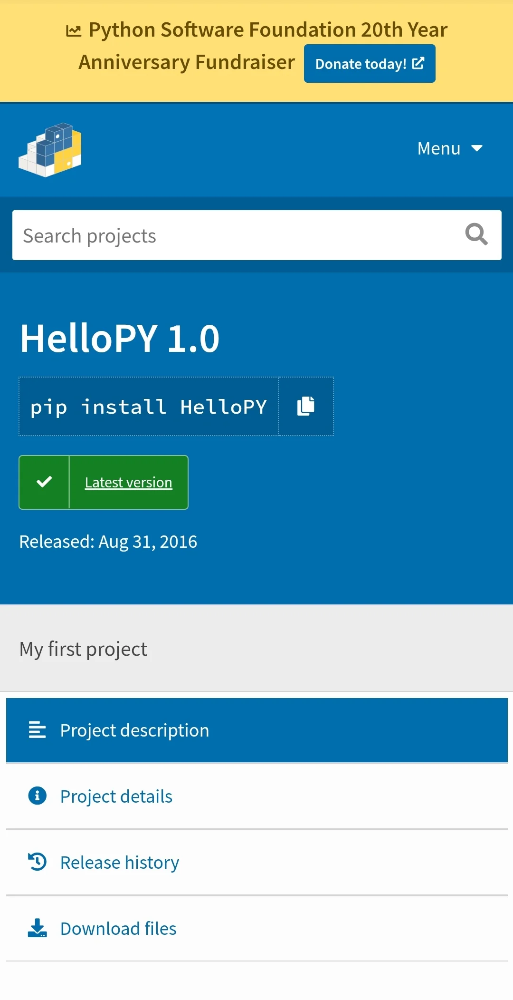

# Interview Questions

1. What are the differences between supervised and unsupervised learning?

2. What is sampling bias? What might be some ways sampling bias is introduced?

3. Explain A/B testing. In what circumstances can you use it?

4. Explain sensitivity in machine learning models. For some models, such as Logistic Regressions, sensitivity is known as the recall or true positive rate.

5. Explain the difference between overfitting and underfitting.

6. Why do we clean data?

7. What are outliers and what can we do with them?

8. How do you select the number of clusters for a clustering algorithm?

9. What are the benefits of using python for data science? Explain you answer.

10. What are hyperparameters? What is hyperparameter tuning?

11. Explain what a perceptron is and how it works. 

<div style="background: #000;
            color: #FFF;
            margin: 0px;
            margin-bottom: 10px;
            padding: 10px 0px 20px 0px;
            text-align: center; 
                ">
    <h1>Review</h1>
</div>

We should know these commands

```sqlite
SELECT column1, column2 FROM table_name;

SELECT * FROM table_name;

SELECT DISTINCT column1, column2 FROM table_name;

SELECT * FROM table_name WHERE condition;

SELECT * FROM table_name WHERE column1="text";

SELECT * FROM table_name WHERE id=1;

SELECT * FROM table_name WHERE id < 10;

SELECT * FROM table_name WHERE id > 10;

SELECT * FROM table_name WHERE id =< 10;

SELECT * FROM table_name WHERE id <> 10; 

SELECT * FROM table_name WHERE id != 10;

SELECT * FROM table_name WHERE column1 IS NULL;

SELECT * FROM table_name WHERE column1 IS NOT NULL;

SELECT * FROM table_name WHERE condition1 AND condition2;

SELECT * FROM table_name WHERE condition1 OR condition2;

SELECT * FROM table_name WHERE NOT condition;

SELECT column1 AS new_column_name FROM table_name;

SELECT column1, column2 AS [new_column1 new_column2] FROM table_name;

SELECT (column1, column2) FROM table_name AS new_table_name;

SELECT int_column FROM table_name BETWEEN 10 AND 20;

SELECT text_column FROM table_name BETWEEN 'a' AND 'z';

SELECT date_column FROM table_name BETWEEN '1996-07-01' AND '1996-07-31';

SELECT * FROM table_name LIKE pattern;

SELECT * FROM table_name IN ('text1', 'text2');

SELECT * FROM table_name NOT IN ('text1', 'text2');

SELECT * FROM table_name ORDER BY column1, column2 ASC;

SELECT * FROM table_name ORDER BY column1, column2 DESC;

SELECT MIN(column1) AS NewName FROM table_name;

SELECT MAX(column1) AS NewName FROM table_name;

SELECT COUNT(column1) AS NewName FROM table_name;

SELECT AVG(column1) AS NewName FROM table_name;

SELECT SUM(column1) AS NewName FROM table_name;

INSERT INTO table_name (column1, column2, column3) VALUES (value1, value2, value3);

INSERT INTO table_name VALUES (value1, value2, value3, value4, value5);

UPDATE table_name SET column1 = value1, column2 = value2 WHERE condition;

DELETE FROM table_name WHERE condition;




```

Say you had two tables:

```sql
Table: Customers

+--------------+------+
| Column Name  | Type |
+--------------+------+
| customer_id  | int  |
| name         | text |
| address      | text |
| email        | text |
+--------------+------+


Table: Orders

+--------------+------+
| Column Name  | Type |
+--------------+------+
| order_id     | int  |
| customer_id  | int  |
| total        | int  |
| shipped      | bool |
+--------------+------+
```

In [73]:
import sqlite3

sql_commands = \
"""
DROP TABLE IF EXISTS Customers;
DROP TABLE IF EXISTS Orders;
DROP TABLE IF EXISTS email_list;

CREATE TABLE Customers (
 customer_id INTEGER PRIMARY KEY,
 name TEXT NOT NULL,
 address TEXT NOT NULL,
 email TEXT NOT NULL
);

CREATE TABLE Orders (
 order_id INTEGER PRIMARY KEY,
 customer_id INTEGER NOT NULL,
 total INTEGER NOT NULL,
 shipped BOOL NOT NULL,
 FOREIGN KEY(customer_id) REFERENCES Customer(customer_id)
);

CREATE TABLE email_list (
  elist_id INTEGER PRIMARY KEY,
  user TEXT,
  address TEXT,
  email TEXT NOT NULL
);

INSERT into Customers (name, address, email) values ('alice', '20 Broadway', 'alice@gmail.com');
INSERT into Customers (name, address, email) values ('bob', '72 4th Ave', 'bob@tutanota.com');
INSERT into Customers (name, address, email) values ('carol', '1002 138th Street', 'carol@protonmail.com');
INSERT into Customers (name, address, email) values ('dave', '345 Chambers Street', 'dave@dave.com');


INSERT into Orders (customer_id, total, shipped) values (1, 20000, true);
INSERT into Orders (customer_id, total, shipped) values (2, 10000, true);
INSERT into Orders (customer_id, total, shipped) values (3, 5000, true);
INSERT into Orders (customer_id, total, shipped) values (2, 25000, true);

INSERT into Orders (customer_id, total, shipped) values (1, 21000, false);
INSERT into Orders (customer_id, total, shipped) values (2, 20000, false);
INSERT into Orders (customer_id, total, shipped) values (3, 20000, false);
INSERT into Orders (customer_id, total, shipped) values (1, 10000, false);

INSERT into email_list (email) values ('random@person.com');
INSERT into email_list (user, address, email) values ('name', 'address', 'email');
"""

db = sqlite3.connect('week-30-class.db')
cursor = db.cursor()
cursor.executescript(sql_commands)
db.commit()
db.close()

In [104]:
# use this function for your answers.
def with_conn(statement):
    conn = sqlite3.connect('week-30-class.db')
    with conn:
        cur = conn.cursor()
        cur.execute(statement)
        result = cur.fetchall()
        return result

In [105]:
with_conn("SELECT * FROM Customers;")

[(1, 'alice', '20 Broadway', 'alice@gmail.com'),
 (2, 'bob', '72 4th Ave', 'bob@tutanota.com'),
 (3, 'carol', '1002 138th Street', 'carol@protonmail.com'),
 (4, 'dave', '345 Chambers Street', 'dave@dave.com')]

In [76]:
with_conn("SELECT * FROM Orders;")

[(1, 1, 20000, 1),
 (2, 2, 10000, 1),
 (3, 3, 5000, 1),
 (4, 2, 25000, 1),
 (5, 1, 21000, 0),
 (6, 2, 20000, 0),
 (7, 3, 20000, 0),
 (8, 1, 10000, 0)]

In [81]:
with_conn("SELECT customer_id, sum(total), count(total) FROM Orders GROUP BY customer_id ;")

[(1, 51000, 3)]

In [82]:
with_conn("SELECT c.name, sum(o.total) FROM Customers AS c, Orders AS o \
WHERE c.customer_id = o.customer_id GROUP BY o.customer_id;")

[('alice', 51000), ('bob', 55000), ('carol', 25000)]

In [107]:
with_conn("SELECT c.name, c.address, c.email, o.total, o.shipped \
FROM Customers AS c, Orders AS o WHERE c.customer_id = o.customer_id")

[('alice', '20 Broadway', 'alice@gmail.com', 20000, 1),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 10000, 1),
 ('carol', '1002 138th Street', 'carol@protonmail.com', 5000, 1),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 25000, 1),
 ('alice', '20 Broadway', 'alice@gmail.com', 21000, 0),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 20000, 0),
 ('carol', '1002 138th Street', 'carol@protonmail.com', 20000, 0),
 ('alice', '20 Broadway', 'alice@gmail.com', 10000, 0)]

### `INNER JOIN`

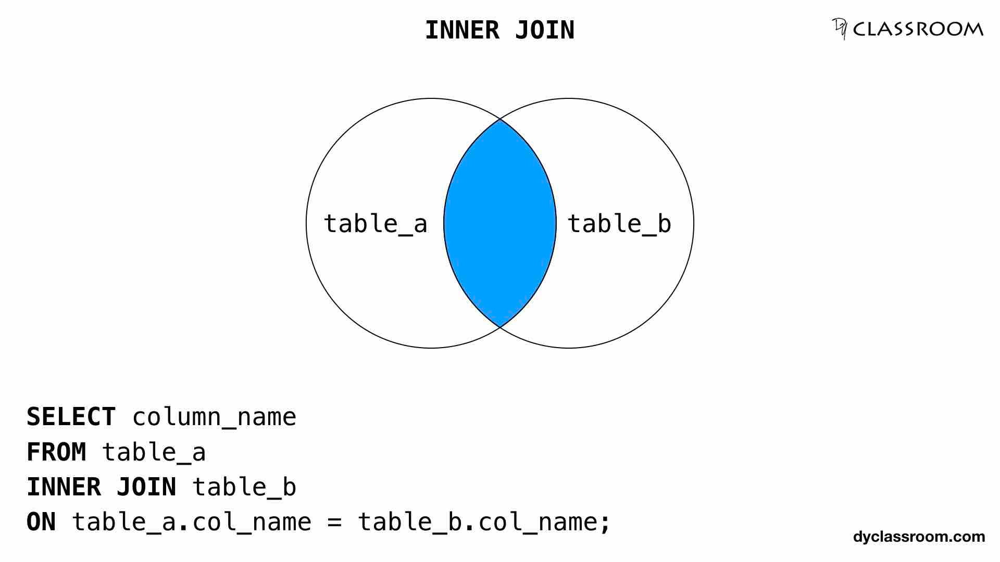


An inner join returns the rows which match the condition you're joining on. **Only** rows that match the condition are returned. For our `Customers`/`Orders` example, an inner join will join the two tables based on the `customer_id`. In our example, a customer can have many orders so each order will be matched with a customer with the corresponding `customer_id`. So we'll get multiple orders with the same customer information.

```sqlite
SELECT column_name
FROM table_a
INNER JOIN table_b
ON table_a.col_name = table_b.col_name

```

In [88]:
with_conn("SELECT c.name, c.address, c.email, o.total, o.shipped \
FROM Orders AS o JOIN Customers AS c ON c.customer_id = o.customer_id;")

[('alice', '20 Broadway', 'alice@gmail.com', 20000, 1),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 10000, 1),
 ('carol', '1002 138th Street', 'carol@protonmail.com', 5000, 1),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 25000, 1),
 ('alice', '20 Broadway', 'alice@gmail.com', 21000, 0),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 20000, 0),
 ('carol', '1002 138th Street', 'carol@protonmail.com', 20000, 0),
 ('alice', '20 Broadway', 'alice@gmail.com', 10000, 0)]

# `LEFT JOIN`

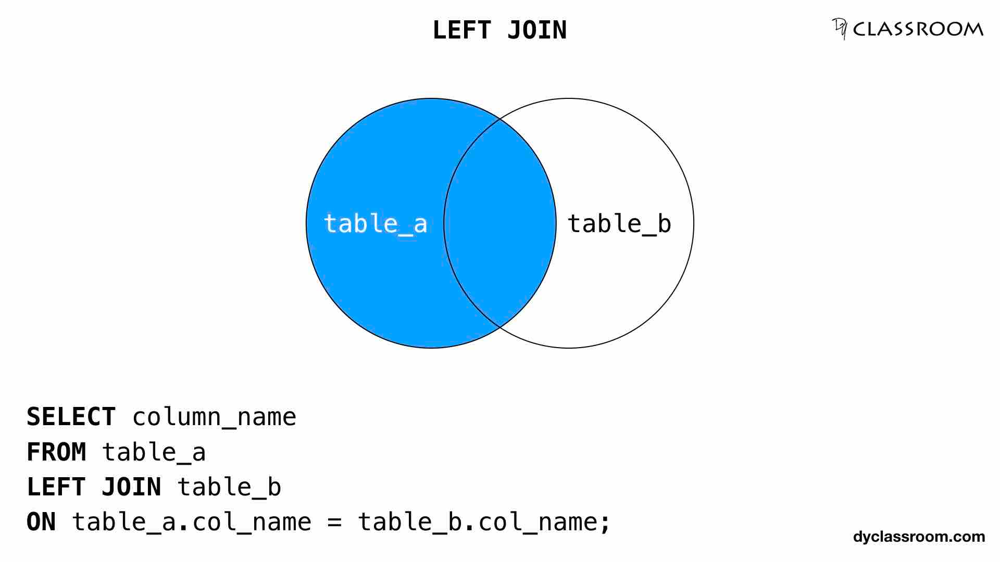

A left join returns, at the minimum, the same thing as an inner join (the tables joined by the matching condition). However, it also returns the information from the left table that do not match with the right table. Meaning if we wanted to `SELECT * FROM a LEFT JOIN b ON a.id = b.id`, we'd join the table by matching `id` but we'll also select from `a` rows that do not have a row in table `b` with matching `id`. 

```sqlite

SELECT column_name
FROM table_a
LEFT JOIN table_b
ON table_a.col_name = table_b.col_name

```

In [96]:
with_conn("SELECT c.name, c.address, c.email, o.total, \
o.shipped FROM Customers AS c LEFT JOIN Orders AS o ON \
c.customer_id = o.customer_id;")

[('alice', '20 Broadway', 'alice@gmail.com', 10000, 0),
 ('alice', '20 Broadway', 'alice@gmail.com', 20000, 1),
 ('alice', '20 Broadway', 'alice@gmail.com', 21000, 0),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 10000, 1),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 20000, 0),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 25000, 1),
 ('carol', '1002 138th Street', 'carol@protonmail.com', 5000, 1),
 ('carol', '1002 138th Street', 'carol@protonmail.com', 20000, 0),
 ('dave', '345 Chambers Street', 'dave@dave.com', None, None)]

In [92]:
with_conn("SELECT c.name, sum(o.total) \
FROM Orders AS o LEFT JOIN Customers AS c ON \
o.customer_id = c.customer_id ;")

[('alice', 131000)]

In [94]:
with_conn("SELECT c.name, sum(o.total) \
FROM Customers AS c LEFT JOIN Orders AS o ON \
c.customer_id = o.customer_id GROUP BY o.customer_id;")

[('dave', None), ('alice', 51000), ('bob', 55000), ('carol', 25000)]

What if you want the rows of the left table that have no match in the right table? 

(note: we get only one customer back; the one that has not ordered anything yet)

In [99]:
with_conn("SELECT c.name, c.address, c.email, o.total, \
o.shipped FROM Customers AS c LEFT JOIN Orders AS o ON \
c.customer_id = o.customer_id WHERE o.customer_id IS NULL;")

[('dave', '345 Chambers Street', 'dave@dave.com', None, None)]

In [98]:
with_conn("SELECT c.name, c.address, c.email, o.total, \
o.shipped FROM Orders AS o LEFT JOIN Customers AS c ON \
c.customer_id = o.customer_id;")

[('alice', '20 Broadway', 'alice@gmail.com', 20000, 1),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 10000, 1),
 ('carol', '1002 138th Street', 'carol@protonmail.com', 5000, 1),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 25000, 1),
 ('alice', '20 Broadway', 'alice@gmail.com', 21000, 0),
 ('bob', '72 4th Ave', 'bob@tutanota.com', 20000, 0),
 ('carol', '1002 138th Street', 'carol@protonmail.com', 20000, 0),
 ('alice', '20 Broadway', 'alice@gmail.com', 10000, 0)]

### Right Join

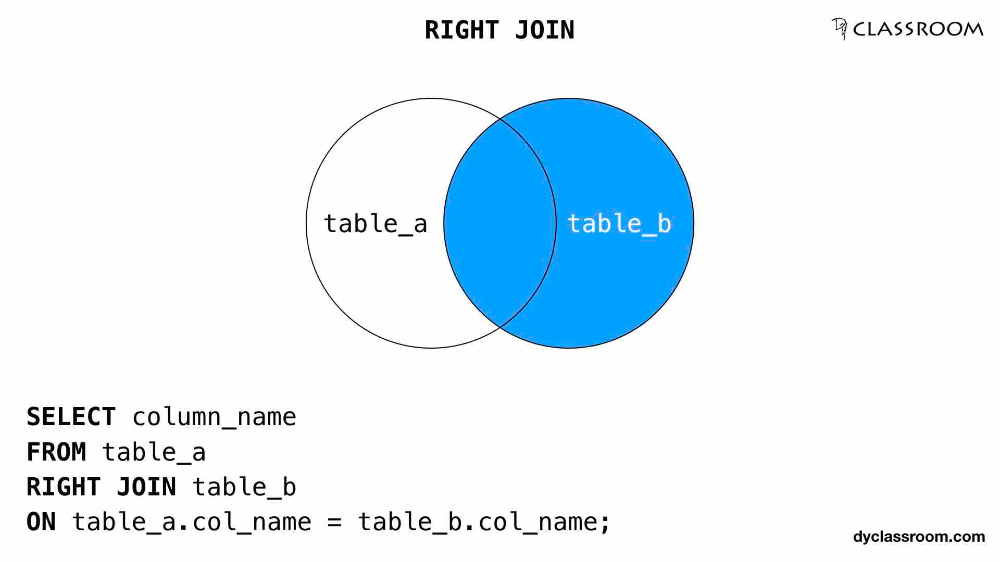

A right (outer) join is exactly the same thing as a left join but returns rows from the right table that do not have a match in the left table. A right join is the same thing as a left join with the tables switched.

```sqlite
SELECT column_name
FROM table_a
RIGHT JOIN table_b
ON table_a.col_name = table_b.col_name
```
is the same thing as:

```sqlite
SELECT column_name
FROM table_b
LEFT JOIN table_a
ON table_b.col_name = table_a.col_name



In [ ]:
with_conn("SELECT c.name, c.address, c.email, o.total, \
o.shipped FROM Orders AS o LEFT JOIN Customers AS c ON \
c.customer_id = o.customer_id;")

What if you want the rows of the right table that don't have a match in the left table? We do the same thing from before with our tables switched.

(note: we get nothing back because all `Orders` have `customer_id` as `NOT NULL` so all rows in `Orders` have a `customer_id` match in table `Customers`.)

In [ ]:
with_conn("SELECT c.name, c.address, c.email, o.total, \
o.shipped FROM Orders AS o LEFT JOIN Customers AS c ON \
c.customer_id = o.customer_id WHERE c.customer_id IS NULL;")

# `FULL OUTER JOIN`

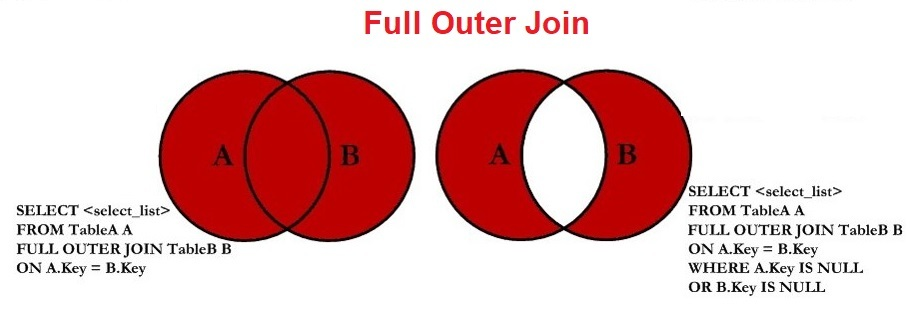

A full outer join still joins the two table based on the match condition but also returns the rows of the left and right table that do not have matches.

Currently, `sqlite` does not support full joins (same with right joins).

In [ ]:
with_conn("SELECT c.name, c.address, c.email, o.total, \
o.shipped FROM Orders AS o FULL JOIN Customers AS c ON \
c.customer_id = o.customer_id WHERE c.customer_id IS NULL;")

### subqueries

There is no general syntax for subsqueries. Subqueries are essentially regular queries placed insider parenthesis and which are executed before the surrounding query. Meaning it can be useful for selecting information to be used in a larger query.

```sqlite

SELECT column_name 
FROM table_name
WHERE column_name IN (SELECT column_name
                  FROM table_name2
                 WHERE condition)
```

```sqlite

SELECT (SELECT column_name from table_name WHERE condition),
       column_name
FROM table_name
WHERE condtion
```

In [ ]:
with_conn("SELECT customer_id FROM Orders WHERE shipped=True;")

In [ ]:
with_conn("SELECT name, address FROM Customers WHERE customer_id IN \
(SELECT customer_id FROM Orders WHERE shipped=True);")

In [ ]:
with_conn("SELECT (SELECT COUNT(*) FROM Orders WHERE \
customer_id = c.customer_id), name, address FROM \
Customers AS c, Orders AS o WHERE c.customer_id = o.customer_id;")

You can also use a `SELECT` statement to select information to insert into a table.

```sqlite
INSERT INTO table_name (column1, column2, column3)
SELECT col1, col2, col3
FROM other_table_name;


INSERT INTO Customer (name, address, email)
SELECT user, address, email
FROM email_list
WHERE user IS NOT NULL, address is NOT NULL;

```

In [ ]:
with_conn("SELECT * FROM Customers")

In [ ]:
with_conn("SELECT * FROM email_list")

In [ ]:
with_conn('SELECT user, address, email FROM email_list \
WHERE user IS NOT NULL AND address IS NOT NULL')

In [ ]:
with_conn("INSERT INTO Customers (name, address, email) \
SELECT user, address, email FROM email_list \
WHERE user IS NOT NULL AND address IS NOT NULL;")

In [ ]:
with_conn("SELECT * FROM Customers")

**The HAVING clause was added to SQL because the WHERE keyword cannot be used with aggregate functions.**

In [ ]:
import sqlite3

sql_commands = \
"""
DROP TABLE IF EXISTS Customers;
DROP TABLE IF EXISTS Orders;
DROP TABLE IF EXISTS email_list;

CREATE TABLE Customers (
 customer_id INTEGER PRIMARY KEY,
 name TEXT NOT NULL,
 address TEXT NOT NULL,
 email TEXT NOT NULL
);

CREATE TABLE Orders (
 order_id INTEGER PRIMARY KEY,
 customer_id INTEGER NOT NULL,
 total INTEGER NOT NULL,
 shipped BOOL NOT NULL,
 FOREIGN KEY(customer_id) REFERENCES Customer(customer_id)
);

CREATE TABLE email_list (
  elist_id INTEGER PRIMARY KEY,
  user TEXT,
  address TEXT,
  email TEXT NOT NULL
);

INSERT into Customers (name, address, email) values ('alice', '20 Broadway', 'alice@gmail.com');
INSERT into Customers (name, address, email) values ('bob', '72 4th Ave', 'bob@tutanota.com');
INSERT into Customers (name, address, email) values ('carol', '1002 138th Street', 'carol@protonmail.com');
INSERT into Customers (name, address, email) values ('dave', '345 Chambers Street', 'dave@dave.com');


INSERT into Orders (customer_id, total, shipped) values (1, 20000, true);
INSERT into Orders (customer_id, total, shipped) values (2, 10000, true);
INSERT into Orders (customer_id, total, shipped) values (3, 5000, true);
INSERT into Orders (customer_id, total, shipped) values (2, 25000, true);

INSERT into Orders (customer_id, total, shipped) values (1, 21000, false);
INSERT into Orders (customer_id, total, shipped) values (2, 20000, false);
INSERT into Orders (customer_id, total, shipped) values (3, 20000, false);
INSERT into Orders (customer_id, total, shipped) values (1, 10000, false);

INSERT into email_list (email) values ('random@person.com');
INSERT into email_list (user, address, email) values ('name', 'address', 'email');
"""

db = sqlite3.connect('week-30-class.db')
cursor = db.cursor()
cursor.executescript(sql_commands)
db.commit()
db.close()

In [ ]:
# use this function for your answers.
def with_conn(statement):
    conn = sqlite3.connect('week-30-class.db')
    with conn:
        cur = conn.cursor()
        cur.execute(statement)
        result = cur.fetchall()
        return result

In [ ]:
with_conn('SELECT * FROM Orders;')

In [ ]:
with_conn('SELECT count(customer_id) FROM Orders GROUP BY customer_id;')

In [ ]:
with_conn('SELECT * FROM Orders GROUP BY customer_id HAVING COUNT(customer_id) > 2;')

In [1]:
# big o notation

What is an example of $O(1)$?

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(0,100, 100)
y = np.ones(100)

plt.title('operations needed for N inputs')
plt.xlabel('number of inputs')
plt.ylabel('operations needed')
plt.plot(x,y)
plt.show()

What is an example of $O(n)$?

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(0,100, 100)
y = x

plt.title('operations needed for N inputs')
plt.xlabel('number of inputs')
plt.ylabel('operations needed')
plt.plot(x,y)
plt.show()

What is an example of $O(n^2)$?

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(0,100, 100)
y = x**2

plt.title('operations needed for N inputs')
plt.xlabel('number of inputs')
plt.ylabel('operations needed')
plt.plot(x,y)
plt.show()

What is an example of something that's $O(log(n))$?

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(0,100, 100)[1:]
y = np.log(x)

plt.title('operations needed for N inputs')
plt.xlabel('number of inputs')
plt.ylabel('operations needed')
plt.plot(x,y)
plt.show()

# permutations and combinations

In [1]:
import itertools

members = ['alice', 'bob', 'carol']


permutations = list(itertools.permutations(members, 2))
combinations = list(itertools.combinations(members,2))

In [2]:
# order matters so
# ('alice', 'bob') is different than
# ('bob', 'alice')
permutations

[('alice', 'bob'),
 ('alice', 'carol'),
 ('bob', 'alice'),
 ('bob', 'carol'),
 ('carol', 'alice'),
 ('carol', 'bob')]

**there is two types of permutations**

**with replacement:**

after choosing, the chosen object is returned to the set

$P(n,r) = n^r$

ex. choosing 2 marbles from a bag of 10 with replacement.

$P(10,2) = 10^{2} = 100$

so there are 100 different permutations of marbles we can choose

**without replacement:**

after choosing, the chosen object is removed while further choices are made.

$P(n,r) = \frac{n!}{n-r!}$

ex. choosing 2 marbles from a bag of 10 with replacement.

$P(10,2) = \frac{10!}{(10-2)!} = \frac{10!}{8!} = 10 * 9 = 90$

so there are 90 different permutations of marble we can choose. The thinking is that after we remove the first marble, our remaining choices are 9 for the 2nd marble. So we have 10 choices for the first marble and then 9 for the second, or 10 * 9 or 90 choices.

In [ ]:
# order doesn't matter
# so ('alice', 'bob') is the same as
# ('bob', 'alice')

combinations

for permutations, order matters so ('alice', 'bob') is considered different than ('bob', 'alice'). 

for combinations, order doesn't matter. so ('alice', 'bob') is considered the same as ('bob', 'alice').

**combination is based off of permutations. in order to get the number of combinations, we take the number of permutations and we remove the duplicates**

since for combinations, ordering doesn't matter so permutations that consist of the same members must be cancelled out. 

$C(n,r) = \frac{n!}{(n-r)!r!}$

You'll notice this is similar to the permutation function ($\frac{n!}{n-r!}$). It is but there is a $r!$ in the denominator. The $r!$ removes duplicates.

rewritten:

$C(n,r) = \frac{P(n,r)}{r!}$

If we have 3 people in a group and we'd like groups of 3.
```
[('alice', 'bob', 'carol')]
```

There are 6 ways we can arrange those groups:

```
[('alice', 'bob', 'carol'),
 ('alice', 'carol', 'bob'),
 ('bob', 'alice', 'carol'),
 ('bob', 'carol', 'alice'),
 ('carol', 'alice', 'bob'),
 ('carol', 'bob', 'alice')]
```

But since we only had 3 members to choose a group of 3 from, each of the 6 groups contain the same 3 members. So in reality, we only have 1 possible group arranged in different orders. If ordering doesn't count, we have $k!$ or in this case $3!$ or $6$ duplicates.
```
[('alice', 'bob', 'carol')]

```

If we wanted groups of 2, we'd still have 6 permutations but now we'd have to remove $2!$ or $2$ permutations and we'd have 3 combinations:

```
permutations:
[('alice', 'bob'),
 ('alice', 'carol'),
 ('bob', 'alice'),
 ('bob', 'carol'),
 ('carol', 'alice'),
 ('carol', 'bob')]

combinations:
[('alice', 'bob'), ('alice', 'carol'), ('bob', 'carol')]

```

In general, if we have $n$ members in a set. There is $n!$ ways to arrange all $n$ members.

If we want to create a smaller subset from that set, we need to divide the $n!$ arrangements by $(n-r)!$ because

ex.

4 students in a class - `{a,b,c,d}`

4! or 24 ways to arrange all 4 students


into 2 person groups:

$$ \frac{4!}{(4-2)!} = \frac{4!}{2!} = \frac{4 \cdot 3 \cdot 2! }{2!} = 4 \cdot 3 = 12 $$

and to remove duplicates (permutations that have the same two students).

$$ \frac{4!}{(4-2)!2!} = \frac{4!}{2! \cdot 2!} = \frac{4 \cdot 3}{2 \cdot 1} = \frac{12}{2}= 6 $$


```
factorials    permutations    combinations
 4!              4!/2!          4!/(2!2!)
----            -------         ---------

abcd             ab             ab/ba
abdc     
acbd             ac             ac/ca
acdb
adbc             ad             ad/da
adcb


bacd             ba             
badc           
bcad             bc             bc/cb             
bcda
bdac             bd             bd/db
bdca

cabd             ca
cadb
cbad             cb
cbda
cdab             cd             cd/dc
cdba

dabc             da
dacb
dbac             db
dbca
dcab             dc
dcba


```

In [ ]:
#try messing with this

import itertools

def show_numbers(n=12, r=12):
    members = [f'{i}' for i in range(n)]
    permutations = list(itertools.permutations(members, r))
    combinations = list(itertools.combinations(members,r))
    print(f"length of members: {len(members)}")
    print(f"length of permuations: {len(permutations)}")
    print(f"length of combinations: {len(combinations)}")
    
show_numbers()

<div style="background: #000;
            color: #FFF;
            margin: 0px;
            padding: 10px 0px 20px 0px;
            margin-bottom: 10px;
            text-align: center; 
                ">
    <h1>A/B Testing</h1>
</div>

## What is A/B Testing?

**"A/B testing (also known as bucket testing or split-run testing) is a user experience research methodology. A/B tests consist of a randomized experiment with two variants, A and B. It includes application of statistical hypothesis testing or "two-sample hypothesis testing" as used in the field of statistics. A/B testing is a way to compare two versions of a single variable, typically by testing a subject's response to variant A against variant B, and determining which of the two variants is more effective."**

source: [wikipedia](https://en.wikipedia.org/wiki/A/B_testing)

## What does this mean?

Essentially A/B testing is a simple controlled experiment where you give some sample population two seperate versions of something, A and B, in order to see which version is more suitable for your needs. Usually you will split your population randomly or through some coordinated measure in order to get meaningful results. You will then compare the results of version A compared to version B. Depending on what metrics you track, you should get results back that allow you to measurably choose one version is better than another.

## What is an example of it's use?

Let's consider the example from Bloomberg. Bloomberg had a homepage they wanted to test changes on. Specifically, they wanted to know what the signup rate was for different subscription plans offered on the homepage. By using A/B testing, they were able to serve two different homepages depending on whether or not a user was classified as a potential subscriber and then they used the metrics they tracked in order to empirically prove there was an increase in signups because of the version of the homepage that the users saw.

Another example:

Say we had a website and we wanted to test different ways to get users to click on a button. We could make changes to the button but that wouldn't tell us if users prefered one to another. Even if metrics we tracked improved, we wouldn't be able to say definitively that it was the change to the homepage that caused it (it could've been unrelated events that led to users clicking the button). But by serving two different homepages and randomly splitting the population of users into two groups seeing different homepages, we can compare the results and use them to effectively say that one version of the homepage performed better than another. Below we see that the measure tracked was click-rates and by using A/B testing, we see that one version of the homepage had a higher click-rate than the other.
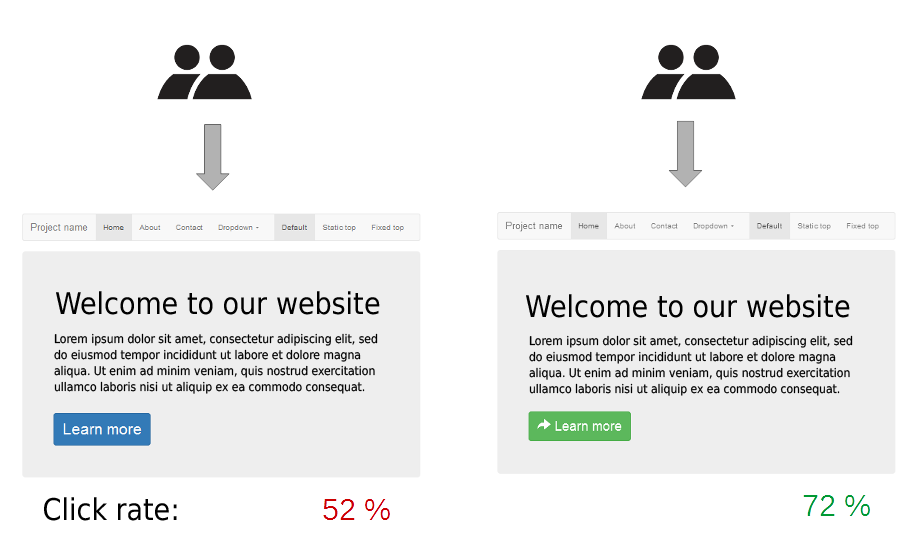
source: [wikipedia](https://en.wikipedia.org/wiki/File:A-B_testing_example.png)

## Why is it useful?

If you think about the example from before, without A/B testing we could maybe reasonably assume that one version was better than another but we wouldn't have a way to prove it. By using A/B testing, we run an experiment on users or whatever we're testing to see with evidence, that one version was better than another. This is useful in situations where we wouldn't otherwise have a way to statistically prove our assumption.

<div style="background: #000;
            color: #FFF;
            margin: 0px;
            padding: 10px 0px 20px 0px;
            text-align: center; 
                ">
    <h1>Hypothesis Testing</h1>
</div>

**When most of us did our data analysis projects for last phase, we formed a base hypothesis and then sough out to investigate it to see if we could form any sort of conclusion from our analysis. We didn't really talk about this process of forming hypotheses and testing them. However in statistics, there are a lot more to discuss in regards to this.**

## What is hypothesis testing?

Hypothesis testing is the processing of statistically testing the results of our survey/experiment to see if you have meaningful results.

## What exactly is a hypothesis?

A hypothesis statement is an assumption we make about the relationship between two variables. For example, we might have a hypothesis that legalizing marijuana in NYC will decrease jail budgets. This assumption, on  its face, seems to make sense. We'd have to investigate more in order to prove it but there isn't anything wrong with that sort of hypothesis. 

We used hypotheses like these when we did our projects. We even investigated our topics in order to prove/disprove our hypothesis. However, we did not **TEST** it. That was the part we left out.

The problem with testing a hypothesis is that the results of analysis might make it seem like our hypothesis is true, but experimental/sampling errors and/or even errors in our data might make it seem that way when it isn't. To get around this we use something called a **null hypothesis** when hypothesis testing.

## What's a null hypothesis?

A null hypothesis is the alternate hypothesis. Essentially it's the hypothesis that disproves your hypothesis. For example, say your hypothesis was that rain made people wet. The null hypothesis is the hypothesis that rain doesn't make people wet. When we perform hypothesis testing, our goal is to disprove our null hypothesis. By doing so not only will we establish that our hypothesis is true, it will also give us a confidence interval by which to gauge our results.

There are different ways to test our null hypothesis. You might've seen "Z-score" or "p-value" used with hypothesis testing. We will be discussing p-values primarily in this course. 

In general the process is:
1. Figure out your null hypothesis
2. State your null hypothesis
3. Choose your test.
4. Reject or accept your null hypothesis.

## Bayesian Hypothesis Testing

**p-value** - in statistics, the p-value is the probability of obtaining results at least as extreme as observed results of a statistical hypothesis test, assuming that the null hypothesis is correct

In other words, the p-value tells you how likely you were to found a particular set of observations if the null hypothesis were true. If the p-value is very small, then the chances of getting those results, if the null hypothesis is true, is very small. In that situation we want to reject the null hypothesis. If the p-value is very large, then the chance of getting those observatives, if the null hypothesis is true, is very high. We cannot reject the null hypothesis in that situation. 

**Significance level** - The level at which we reject/accept the null hypothesis is called the **significance level**. Typically the signficance level is  often set to 0.05 (meaning there's a 5% chance you'll find support for your original hypothesis when in actuality the null hypothesis is true). In some fields, the significance level used is very small to lower the chance of incorrectly accepting the original hypothesis. 

## Real World Example:

**original hypothesis** - Children who take vitamin C are less likely to become ill during the flu season.

**null hypothesis** - Children who take vitamin C are no less likely to become ill during flu season.

**significance level** - The signficance level is 0.05

**p-value** - The p-value calculated is 0.20

**Conclusion** - After providing one group with Vitamin C during flu season and the other with a placebo, you record whether or not participants got sick at the end of the flu season. After conducting your statistical analysis on the results, you determine a p-value of 0.20. That is above the desired significance level of 0.05 (meaning the chances of getting those results given the null hypothesis is true is very high). That is above the desired signficance level of 0.05 and thus you fail to reject the null hypothesis. Based on the results, we cannot support the hypothesis that vitamin C can prevent colds.

### Real World Example:
The following has been adapted from: https://medium.com/dataseries/hypothesis-testing-in-machine-learning-what-for-and-why-ad6ddf3d7af2

Suppose you are working on a machine learning project, for which you want to predict if a set of patients have or not a mortal disease, based on several features on your dataset as blood pressure, heart rate, pulse and others.

Sounds like a serious project, for which you’ll need to really trust your model and predictions, right? That’s why you got hundreds of samples, that your local hospital very gently allowed you to collect, given the importance and the seriousness of the topic. But how do you know if your sample is representative of the whole population? And how can we know how much difference might be reasonable? For example, assume that thanks to some previous studies we know that the real probability for any given patient of not having this particular disease is 99%. Now suppose that our sample says that 95% of the patients don’t have the disease. Well, 4% difference doesn’t sound like a significant difference that may lead us to SUCH bad modelling, right? It might not be the same, but it kind of sounds like it may be representative. To confirm this, we need to build a better understanding of the theoretical background.

Let’s start by what we know…the real probability of not having the disease:

$$ P(\text{not having the disease}) = 99% $$

Now let's assume that we find a group of 100 people and we test all of them to check if any has this disease we're studying. Can we be sure that 99 of these folks won't have the disease? Maybe, but there's also a possibility that none of them has the disease, or even that several may have it. What we have here, is a binomial probability problem. The objective of this story is not to talk about probabilities, however, in simple words, the binomial probability is no more than a given chance of something happening a fixed number of times, given a prior probability for each independent event. We can find it by just applying the following equation:

$$ P(x) = {n \choose x}p^x q^{n-x} = \frac{n!}{(n-x)!x!}p^xq^{n-x}$$

where:
* $n = $ the number of trials (or the number being sampled)
* $x = $ the number of successes desired
* $p = $ probability of getting a success in one trial
* $q = 1-p = $ the probability of getting a failure in one trial

*example:* What is the probability of getting 4 heads in 10 coin tosses?

we have:
* $n = 10$
* $x = 4$
* $p = 0.5$
* $q = 1-0.5 = 0.5$

so our formula becomes:
$$ P(x) = {n \choose x}p^x q^{n-x} = \frac{10!}{(10-4)!4!}0.5^4 0.5^{10-4} = \frac{10!}{(6!4!)}0.5^4 0.5^{6}$$

$$ P(x) = \frac{10!}{(6!4!)}0.5^4 0.5^{6} = \frac{10\cdot9\cdot8\cdot7}{4\cdot3\cdot2\cdot1}0.5^{10} $$

$$ P(x) = {210}\cdot{0.0009765625} = 0.205078125$$

or roughly 20%.

So if we want to know what is the probability that in our sample of 100 guys, we don’t have any of them infected with the disease, we may just fill in the blanks to find that the probability is of 36.6%. And if we want to know the probability of having 99% folks NOT infected, we fill in the blanks again, to find out it is approximately 37.0%. And this sounds reasonable: getting 100 out of 100 not infected doesn’t sound very unlikely if every single case has 99% of not being infected. And in this line, it also sounds reasonable that having 99 not infected out 100 folks might be a little more likely.

We could keep going and find the probability of having even less people not infected in our sample of 100 people:
* $ P(\text{not infected 98 out of 100}) = 18.5%$
* $ P(\text{not infected 97 out of 100}) = 6.0%$
* $ P(\text{not infected 96 out of 100}) = 1.5%$
* $ P(\text{not infected 95 out of 100}) = 0.3%$

Now, let’s go back to the sample we had from our friendly local hospital, which says that 95% of the guys in our sample are NOT infected by this horrible mortal disease. Well, even though it might sound like the difference in between 95% and 99% is not relevant, given that we would not be working with a random sample of folks, but instead these guys belong to the same population that we know has a 99% probability of not being infected, we’d be setting a hypothesis that our sample is representative when in reality we would have only 0.3% chance of obtaining a sample with 95 out of 100 people not infected. Therefore we should reject our hypothesis and not proceed.

### How do I apply this in my machine learning project?

A representative sample is one which is drawn without bias from the population of interest. Representativeness is not so much about the sample size but depending on the right composition of the sample. In the 1960s, A.C. Nielsen Jr. gave an interesting answer to those, who believed that a higher sample size would increase its representativeness.

**"If you don’t believe in random sampling, the next time you have a blood test, tell the doctor to take it all.” — A.C. Nielsen Jr."**

In fact, a sample of just 30 or more experimental units are often considered as enough (if this sounds crazy few, surely Google will be able to double check this for you). And if that sample is well done, respecting the different segments and quotas within the population, our 30+ units sample should be indeed representative. However, if you want to be completely sure about that, the technique for checking this representativeness is called **hypothesis testing**. . Hypothesis testing is used to compare two datasets. It is a statistical inference method so, at the end of the test, we’ll get to a conclusion about if there’s a difference between the groups we’re comparing.

Now the bad news: even though in real life sometimes you can generate some base statistics or ground knowledge out of a census or some previous research as to use hypothesis testing, most of the times, we won’t have data such as the mean and standard deviation of our population. So you’ll have to work hard to be as sure as possible that our sample is representative of the population.

Nonetheless, whether we can or we cannot use this technique to assure the representativeness of our sample, in the context of machine learning, we can use hypothesis testing to check if our test group is representative of our train data. For that, there are some key concepts we should know:
1. The "null hypothesis"
2. The "alternative hypothesis"
3. The z-statistics or t-statistics concept
4. The p-value concept

To explain these concepts I’m going to use an example. Say we are testing the efficacy of a new drug, so we randomly select 50 people to be in the placebo control group and 50 people to receive the treatment. We know that our both groups were selected from a broader, unknown population pool, but it could be possible that we could have ended up with a different random sample of subjects from the population pool.

In this context, the **null hypothesis** ($H_0$) is a fundamental concept of frequentist statistical tests. We typically denote the null hypothesis with H0. In the context of experiments, we often talk about the “control” group and the “experimental” or “treatment” group. In our drug example, the control group is the group given the placebo and the treatment group will be given the actual drug. We can then define our null hypothesis to be that there is no difference between a subject taking a placebo and the treatment drug. Measured by the average difference in blood pressure levels between the treatment and control groups. Therefore, our null hypothesis would be:

**$H_O$: The mean difference between treatment and control groups is zero.**

Meanwhile, the **alternative hypothesis** ($H_1$) is the outcome of the experiment that we hope to show. In our example, the alternative hypothesis is that there is a mean difference in blood pressure between groups:

**$H_1$: The difference between systolic blood pressure between groups is not 0.**

Say now that in our experiment we measure the following results:
* Control group: 50 subjects and average systolic blood pressure of 121.38
* Experimental/treatment group: also 50 subjects and average systolic blood pressure of 111.56

The difference between experimental and control groups is -9.82 points. But with 50 subjects in each group, how confident can we be that this measured difference is real? Now is the real fun begins (nerd kind of fun, of course): to find this we’ll have to use statistics to find a measure of the degree to which our groups differ or not. To do that there are several different types of tests we can use within the world of statistics. In this post we’re going to talk about Z-Tests and T-Tests. The main differences in between these two kinds are:

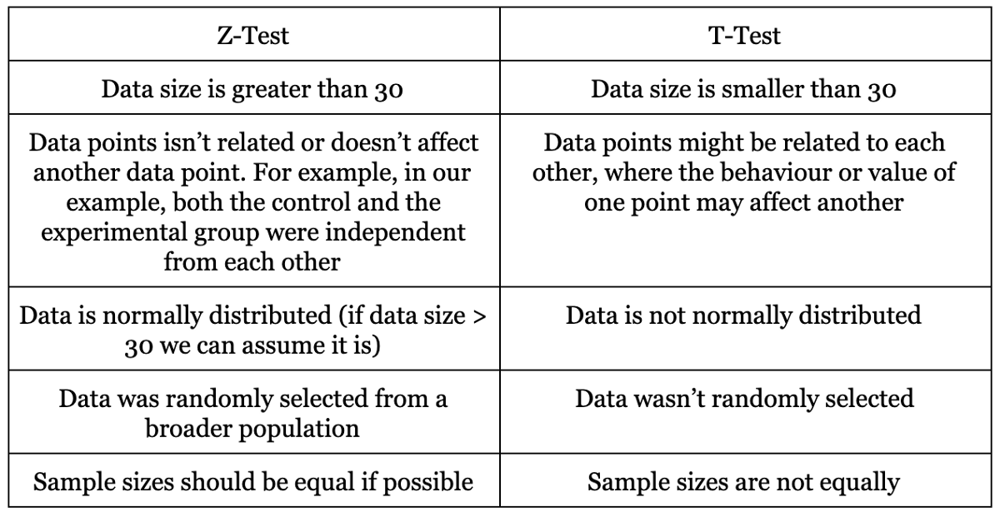

In our case, our sample sizes are equal, larger than 30, we can assume normality, they were randomly selected from a broader population and they are indeed independent of each other, so we can proceed with a Z-Test.

Following our experiment example, to test our hypotheses we’ll have to rely on the Central Limit Theorem. Let’s refresh this concept: the Central Limit Theorem establishes that if we gather together a set of independent random variables (for example, the mean of independent groups, as our experimental and control groups) they should follow a normal distribution even if the original variables themselves are not normally distributed. Suppose then that a sample is obtained containing a large number of observations, each observation being randomly generated in a way that does not depend on the values of the other observations, and that the arithmetic mean of the observed values is computed. If this procedure is performed many times, the central limit theorem says that the distribution of the average will be closely approximated by a normal distribution. Back to our experiment, we don’t know whether or not the systolic blood pressure is normally distributed, but since the size of our sample is larger than 30, we can assume normality. So this would be our picture taking the mean of both groups:

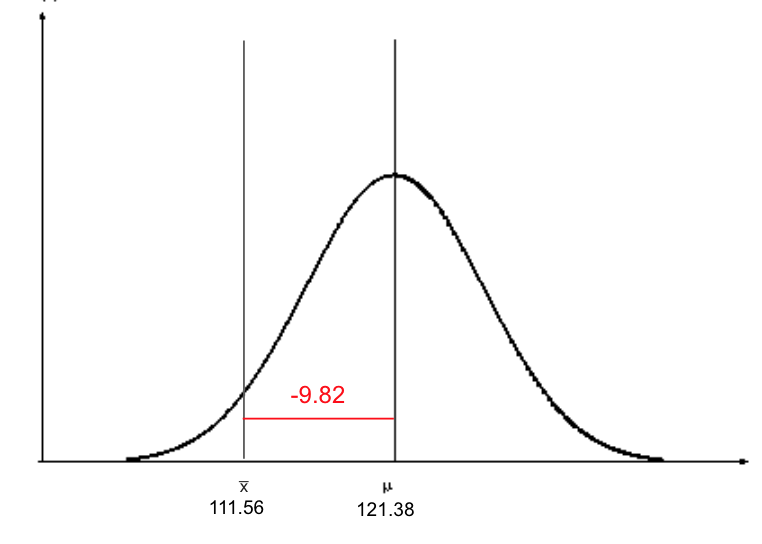

In this context, we want to figure out what’s the probability of finding a result at least as low as 111.56. In other words: what’s the probability of having a difference of -9.82 in between means. And to know that we’ll check how many standard deviations from the mean we are. And how do we do that? We’ll find what is known as a Z-Value.

How to find this value depends on what we’re comparing. Suppose you’re working on a regression problem and you need to create a test group. You’d like to know if your test group is representative of your dataset, right? You could check that by finding the Z-Value, comparing the mean of your test group with the mean of your train data and dividing the result by the standard deviation of the sampling distribution:

$$ z = \frac{x - \mu}{\sigma}$$

This would give us how many standard deviations we are from the mean. Now, it’s true that usually we don’t know our sampling standard deviation. That’s why, thanks again to the Central Limit Theorem -given that we have a 30+ sample size, we can find our sampling distribution as follows:

Being $\sigma$ the standard deviation of our population. Nonetheless, it’s also true that more often than not, we won’t know either the standard deviation of the population. However, when working with samples, it’s usual that to work with what is known as a point estimate. In this case, our sample standard deviations it’s going to be a point estimate of our population standard deviation. In statistics, point estimation involves the use of sample data to calculate a single value which serves us as a “best guess” or “best estimate” of an unknown population parameter. For example:
* The sample mean is a point estimate of the population mean
* The sample variance is a point estimate of the population variance

Replacing them in our original equation, we then get:
$$ Z = \frac{\bar{x} - \mu}{\frac{\sigma}{\sqrt{n}}} $$ 

So as we already saw, in this case we can proceed and find our Z-Value. However, sometimes the conditions will not be met and we won’t be able to find it. In these cases we’ll have to find what is known a T-Value. What’s the difference between them? Absolutely nothing. The only difference will be what we’ll do with these values.

Mind that till now, we have the probability of nothing… we just have how many standard deviations away from the mean our test group mean is. We could find this probability, but in real life, what most people do is check what is called a t or z-table.

Let’s see first how to use a z-table:

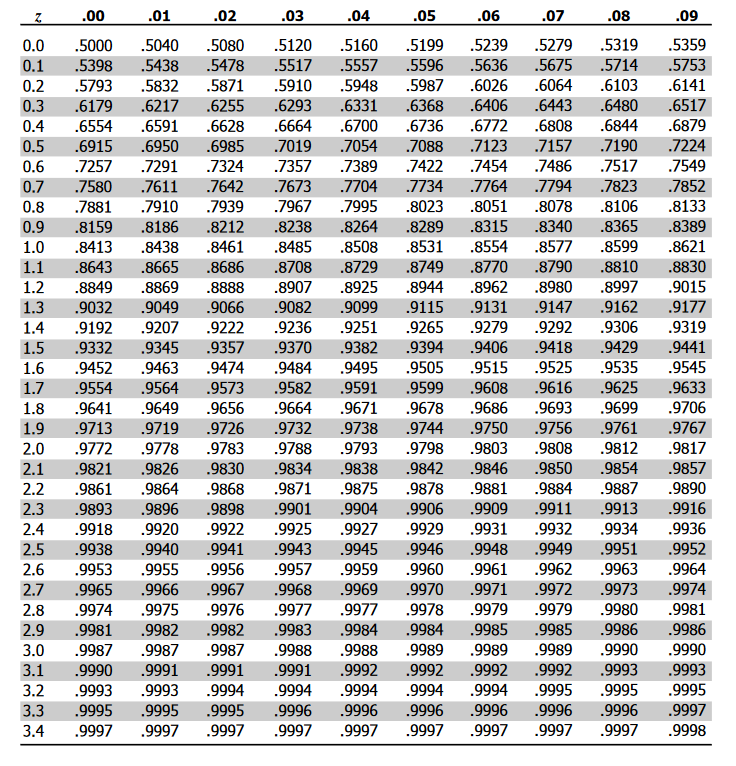

This table can be easily found online. To use it, we need to take the Z-Value we previously found and look it up through both the horizontal and vertical axis. For example, if we had a Z-Value of 0.23, we would have a probability of 0.5910 of finding a mean at least as extreme as the one of our test group:

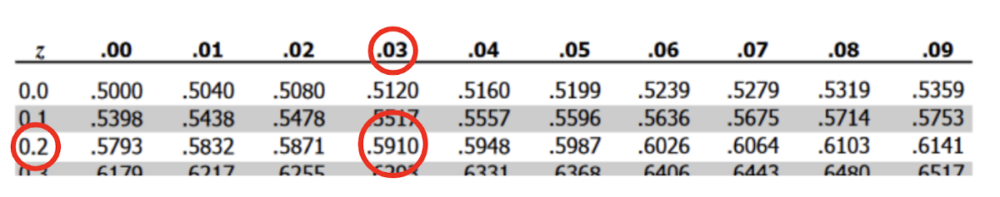

This probability is what is known as the p-value. The following chart is often used as a good reference for this:

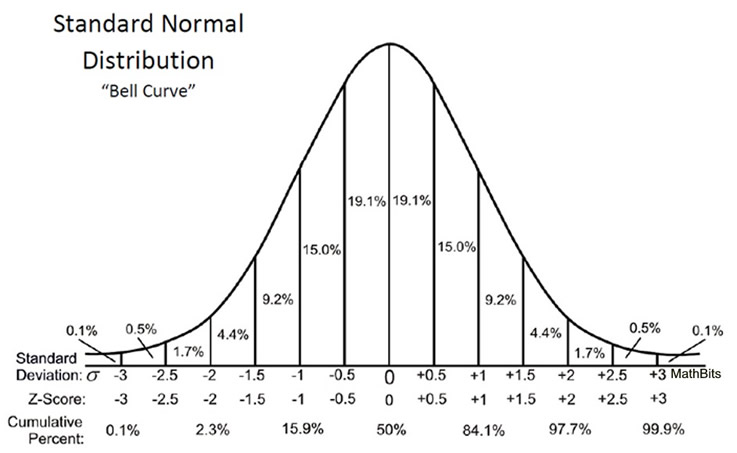

Now if our dataset doesn’t meet the requirements (our data size is smaller than 30 sample units, the data is not normally distributed and/or any of the other conditions we saw) for us to use a z-table we could use a t-table:

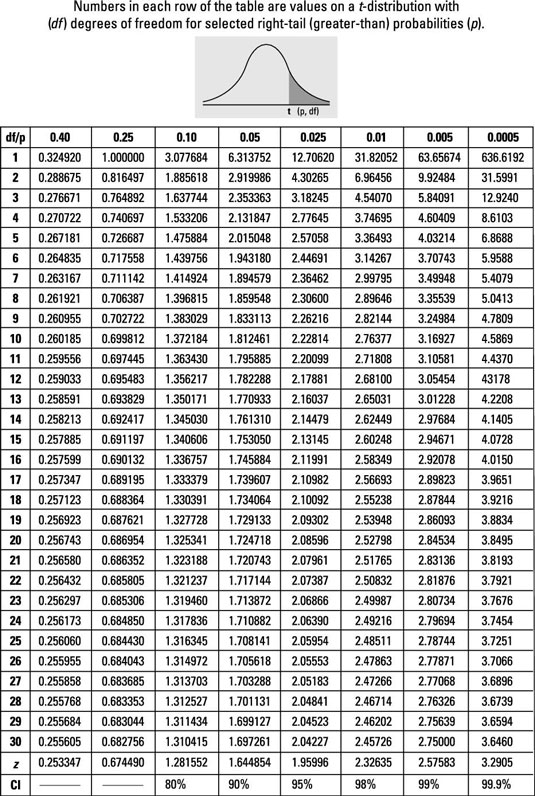

In this table we’re going to search the T-Value within the table instead and we’ll also need our sample size. Take the following example:

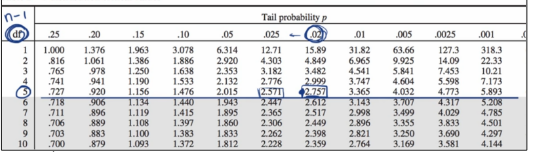

In this case, with a sample size equal to 5 and a Z-Value of 2.75, we would have a tail probability of 0.02. This means that our test group mean would have a probability of 2% of being at least AS HIGH. Mind that this table gives us the TAIL probability, which means we would also have a probability of 2% of being at least AS LOW as -2.75 standard deviations from the mean. And all in all then, a probability of 96% of having a mean in between 2.75 and-2.75 standard deviations away from our mean.

An important clarification is that the equations we saw above apply only to when we are comparing a certain value with our sample mean. If we wanted to compare the mean of two different samples or datasets, the equation to find our z or T-Value would be different. The following table gives a good reference of what to use in each case:

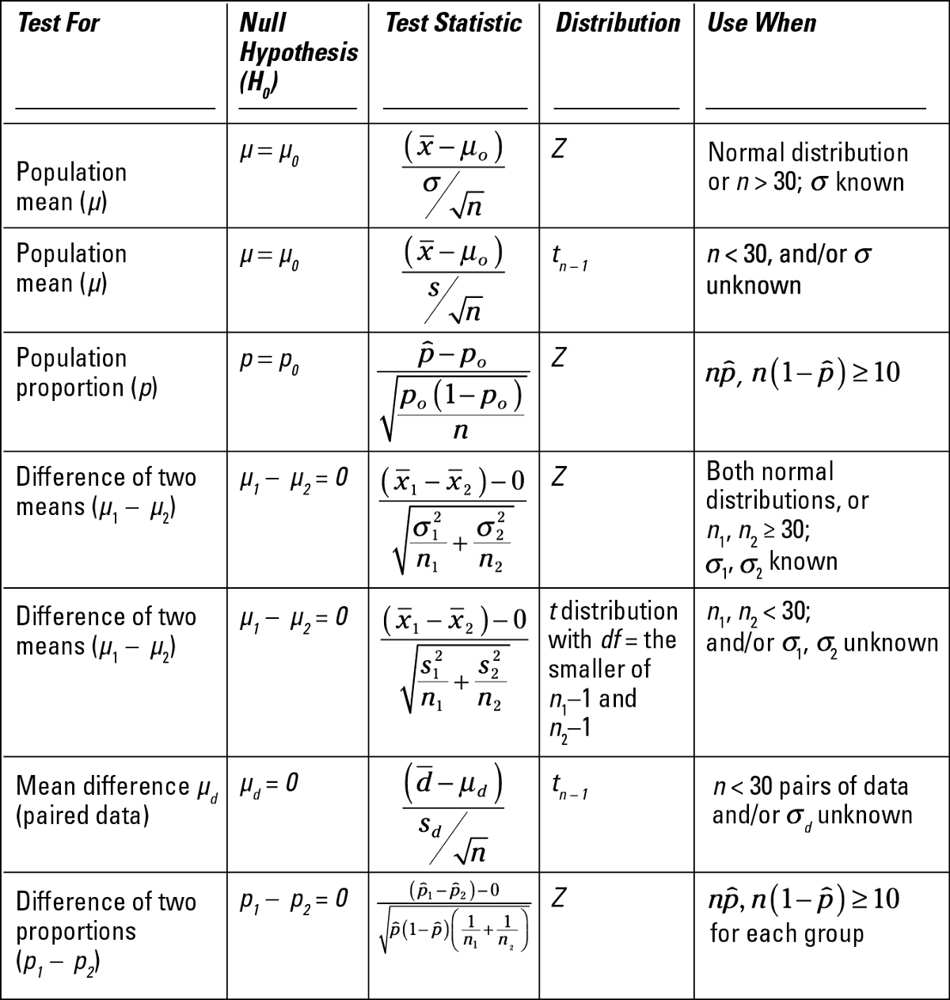

Amazing, we’re almost there! Now we got a solid ground about how this whole hypothesis testing thing works, let’s get back to our example. The last thing we saw was:

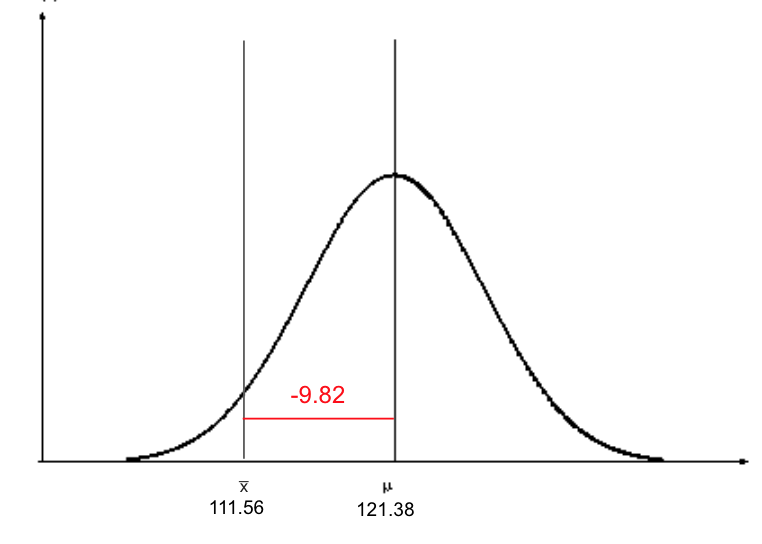

In our example, we’ll be working with the difference between two means and using the following equation:

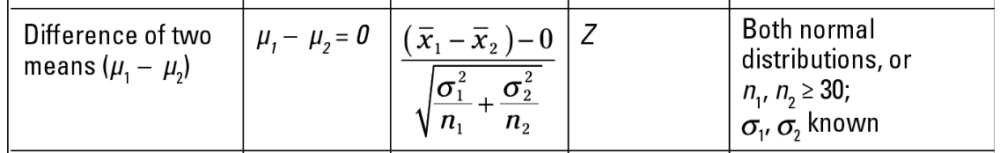

Seems like a messy formula? Don’t worry, Python is here to save us. We can easily do this using the statsmodel library in the following way:

In [23]:
from statsmodels.stats import weightstats as stests
import numpy as np

experimental = np.random.normal(loc=121.38,scale=30, size=50)
control = np.random.normal(loc=111.56,scale=12, size=50)

ztest, pval = stests.ztest(experimental, control, value=0, alternative='two-sided')

In [24]:
ztest

3.7786647817913446

In [25]:
pval

0.00015767150318905468

**Note these values are incorrect because we do not have the actual data**

And look what I'm giving to the function:
* both groups to be tested
* `value = 0` since we're expected a difference of zero between the means
* `alternative='two-sided'` since we want to know the probability of finding a difference at least as low as `-9.82`, but also at least as high as `+9.82`.

We can now print our results in the following way:

```python
>>> print(ztest)
-1.8915462966190273
>>> print(pval)
0.05855145698013669
```

This is telling us we have a probability of 5.855% of finding a value at least as EXTREME as 9.82. Either positive or negative. Meaning that in this case each of our tails has a probability of 2.9275%.

In a very similar way, if our sample sizes were smaller than 30, we should proceed with a T-Test instead, using the following formula:

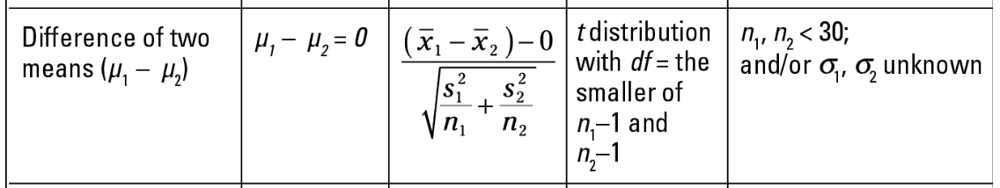

And for this kind of test, the library we should use would be stats from scipy:

In [ ]:
import scipy.stats as stats
import numpy as np

experimental = np.random.normal(loc=121.38,scale=30, size=50)
control = np.random.normal(loc=111.56,scale=12, size=50)

t_test_result = stats.ttest_ind(experimental, control)

t_test_result.statistic, t_test_result.pvalue

```python
import scipy.stats as stats

t_test_result = stats.ttest_ind(experimental, control)
```
In a similar way as before, we can get our metrics by calling:

```python
>>> t_test_result.statistic
-1.8915462966190273
>>> t_test_result.pvalue
0.061504240672530394
```

Mind how as we said before, both our t_test_result.statistic from scipy and our ztest from statsmodel gave us the same number: -1.89.

We could also plot our t distribution, centred on zero, with a vertical line on our measured t-statistic the following way:

In [ ]:
from matplotlib import pyplot as plt

# generate points on the x axis between -4 and 4:
xpoints = np.linspace(-4, 4, 500)
# use stats.t.pdf to geT-Values on the probability density function for the t-distribution
# the second argument is the degrees of freedom: n1 + n2–2
ypoints = stats.t.pdf(xpoints, (50+50-2), 0, 1)
# initialize a matplotlib “figure”
fig, ax = plt.subplots(figsize=(8, 5))
# plot the lines using matplotlib’s plot function:
ax.plot(xpoints, ypoints, linewidth=3, color='darkred')
# plot a vertical line for our t-statistic
ax.axvline(-1.89, color='black', linestyle='--', lw=5)
plt.grid()
plt.show()

Wrapping up: we have measured a difference in blood pressure of -9.82 between the experimental and control groups. We then calculated a t-statistic associated with this difference of -1.89. This means that our two-tailed P value is 0.0615, meaning there’s a 6.15% chance of finding a mean at least as extreme as the one of our test group, given there is a 0.0 true difference in blood pressure between experimental and control conditions. However, our null hypothesis states there is no difference between groups. A t-statistic for no difference between the groups would be 0. Recall that our alternative hypothesis is that the difference between the groups is not 0. This could mean the difference is greater than or less than zero — we have not specified which one. This is known as a 2-tailed t-test and is the one we are currently conducting. So we should add another line to the right of our mean:

In [ ]:
from matplotlib import pyplot as plt

# generate points on the x axis between -4 and 4:
xpoints = np.linspace(-4, 4, 500)
# use stats.t.pdf to geT-Values on the probability density function for the t-distribution
# the second argument is the degrees of freedom: n1 + n2–2
ypoints = stats.t.pdf(xpoints, (50+50-2), 0, 1)
# initialize a matplotlib “figure”
fig, ax = plt.subplots(figsize=(8, 5))
# plot the lines using matplotlib’s plot function:
ax.plot(xpoints, ypoints, linewidth=3, color='darkred')
# plot a vertical line for our t-statistic
ax.axvline(-1.89, color='black', linestyle='--', lw=5)
ax.axvline(1.89, color='black', linestyle='--', lw=5)
plt.grid()
plt.show()

### Good versus Bad

Now that we understand more about how to perform a hypothesis test, there’s only one thing left to see: once we have our p-value, what is a good or bad p-value? Here’s when the concept of confidence levels jumps in, being the probability that the value of a parameter falls within a specified range of values. Pay attention to the words ‘range of values’: they make reference to the confidence interval. Which, according to Wikipedia, is a type of interval estimate, computed from the statistics of some observed data. The interval has an associated confidence level that, loosely speaking, quantifies the level of confidence that the parameter lies within the interval.

One important thing about the confidence level is that we need to define it prior to examining the data. Otherwise, we would be cheating :). Most commonly, the 95% confidence level is used. However, other confidence levels can be used, for example, 90% and 99%. Take the following image as a reference for the Z-Value associated with each confidence level:

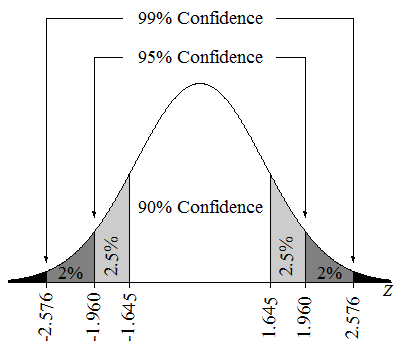

As we have seen before, for any given Z-Value we’ll have a certain tail probability. If we have to take one or both tails, it depends on our hypothesis.

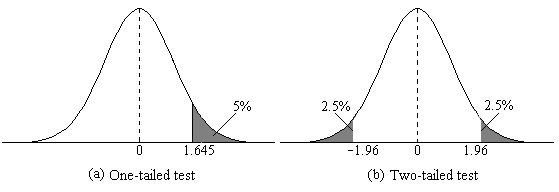

### Hypothesis testing process in a nutshell
We could wrap up the entire process in the following steps:
1. Define hypothesis
2. Set confidence level
3. Calculate point estimate
4. Calculate test statistic
5. Find the p-value
6. Interpret results

### How else can we apply all this?
Testing our train group versus our test group is not the only thing we’d like to do with hypothesis testing in machine learning. Let’s see a few more use cases:
* As we said before, if somehow we know the mean of our population, we could run a proper test to know if we have a representative sample
* Also, working in a classification problem, we could check if our feature vectors are meaningful distinguishable in between our different targets as for our machine learning model to identify them. To know if that’s the case we could then take the individual vector for each or some of the features, and compare in between the different categories of our target to confirm if there’s a significant difference between them.
* In a website A/B testing, once the different versions of it have been running for a while, we could compare whether there’s a significant difference between their performance. For example, taking one specific metric, as the average click-through rate (CTR) and comparing in between the different versions of the website tested.
* We may also want to check if we may have a symmetrical distribution for any of our features, even our target variable, running a test to check if mode, mean and median are the same. When the values of mean, median and mode are not equal, then the distribution is said to be asymmetrical or skewed. We can do this be finding our t-statistic in the following way: 
$$ \text{t_statistic} = \frac{(\text{sample_mean}-\text{sample_median})}{\frac{\text{sample_std}}{\text{sample_size^0.5}}}$$ 


<div style="background: #000;
            color: #FFF;
            margin: 0px;
            margin-bottom: 10px;
            padding: 10px 0px 20px 0px;
            text-align: center; 
                ">
    <h1>Hypothesis Testing Examples</h1> 
</div>

# Confidence Level

Levels chosen by the investigator/researcher. Most commonly, a 95% confidence level is used but 90% and 99% are also common. These levels are used with confidence intervals.

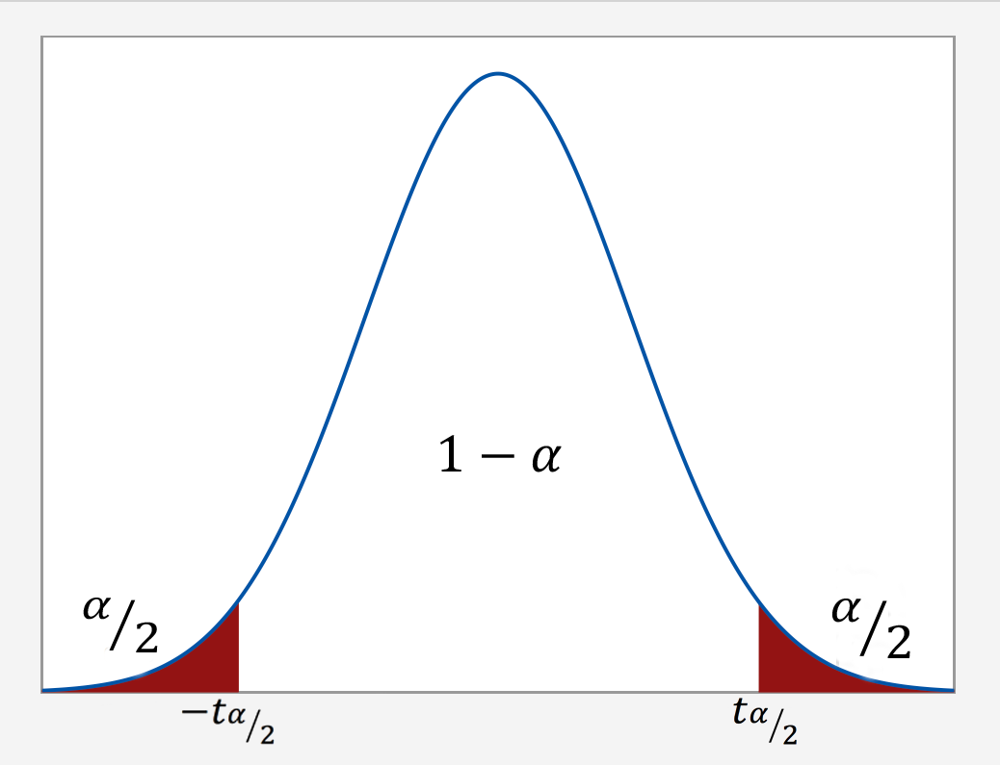

<table>
 <tr>
     <td>Confidence Coefficient $(1-\alpha)$</td>
     <td>Confidence Level $(1-\alpha)\times100$</td>
     <td>(1-$\frac{\alpha}{2}$)</td>
     <td>$\frac{\alpha}{2}$</td>
 </tr>
 <tr>
    <td>0.90</td>
    <td>90%</td>
    <td>0.95</td>
    <td>0.05</td>
 </tr>
 <tr>
    <td>0.95</td>
    <td>95%</td>
    <td>0.975</td>
    <td>0.025</td>
 </tr>
 <tr>
    <td>0.99</td>
    <td>99%</td>
    <td>0.995</td>
    <td>0.005</td>
 </tr>
</table>

# Confidence Interval
source: [Confidence Interval - Wikipedia](https://en.wikipedia.org/wiki/Confidence_interval)

When finding the mean of a survey, we are calculating a point estimation, meaning a single value given as the estimate of a population parameter (the mean). Since our point estimation is based on a sample of the population, it might not be correct. So we might want to provide an interval estimate, essentially a range  within which our mean is estimated to lie. 

For example, a confidence interval can be used to describe how reliable survey results are. In a poll of election–voting intentions, the result might be that 40% of respondents intend to vote for a certain party. A 99% confidence interval for the proportion in the whole population having the same intention on the survey might be 30% to 50%. From the same data one may calculate a 90% confidence interval, which in this case might be 37% to 43%. A major factor determining the length of a confidence interval is the size of the sample used in the estimation procedure, for example, the number of people taking part in a survey. 

Various interpretations of a confidence interval can be given (taking the 90% confidence interval as an example in the following)
* The confidence interval can be expressed in terms of samples (or repeated samples): "Were this procedure to be repeated on numerous samples, the fraction of calculated confidence intervals (which would differ for each sample) that encompass the true population parameter would tend toward 90%."
* The confidence interval can be expressed in terms of a single sample: "There is a 90% probability that the calculated confidence interval from some future experiment encompasses the true value of the population parameter." Note this is a probability statement about the confidence interval, not the population parameter. This considers the probability associated with a confidence interval from a pre-experiment point of view, in the same context in which arguments for the random allocation of treatments to study items are made. Here the experimenter sets out the way in which they intend to calculate a confidence interval and to know, before they do the actual experiment, that the interval they will end up calculating has a particular chance of covering the true but unknown value.
* he explanation of a confidence interval can amount to something like: "The confidence interval represents values for the population parameter for which the difference between the parameter and the observed estimate is not statistically significant at the 10% level".[6] This interpretation is common in scientific articles that use confidence intervals to validate their experiments, although overreliance on confidence intervals [can cause problems as well](https://en.wikipedia.org/wiki/Misuse_of_p-values).

### Examples

taken from:  
https://online.stat.psu.edu/statprogram/reviews/statistical-concepts/confidence-intervals

https://online.stat.psu.edu/statprogram/reviews/statistical-concepts/hypothesis-testing

**Should using a hand-held cell phone while driving be illegal?**

There is little doubt that over the years you have seen numerous confidence intervals for population proportions reported in newspapers.

For example, a newspaper report (ABC News poll, May 16-20, 2001) was concerned whether or not U.S. adults thought using a hand-held cell phone while driving should be illegal. Of the 1,027 U.S. adults randomly selected for participation in the poll, 69% thought that it should be illegal. The reporter claimed that the poll's "margin of error" was 3%. Therefore, the confidence interval for the (unknown) population proportion p is 69% ± 3%. That is, we can be really confident that between 66% and 72% of all U.S. adults think using a hand-held cell phone while driving a car should be illegal.


**Criminal Trial Analogy**

One place where you can consistently see the general idea of hypothesis testing in action is in criminal trials held in the United States. Our criminal justice system assumes "the defendant is innocent until proven guilty." That is, our initial assumption is that the defendant is innocent.

In the practice of statistics, we make our initial assumption when we state our two competing hypotheses -- the null hypothesis ($H_0$) and the alternative hypothesis ($H_A$). Here, our hypotheses are:

$H_0$: Defendant is not guilty (innocent)  
$H_A$: Defendant is guilty  

In statistics, we always assume the null hypothesis is true. That is, the null hypothesis is always our initial assumption.

The prosecution team then collects evidence — such as finger prints, blood spots, hair samples, carpet fibers, shoe prints, ransom notes, and handwriting samples — with the hopes of finding "sufficient evidence" to make the assumption of innocence refutable.

In statistics, the data are the evidence.

The jury then makes a decision based on the available evidence:
* If the jury finds sufficient evidence — beyond a reasonable doubt — to make the assumption of innocence refutable, the jury rejects the null hypothesis and deems the defendant guilty. We behave as if the defendant is guilty.
* If there is insufficient evidence, then the jury does not reject the null hypothesis. We behave as if the defendant is innocent.

In statistics, we always make one of two decisions. We either "reject the null hypothesis" or we "fail to reject the null hypothesis."

**Gum Thickness**

A manufacturer claims that the thickness of the spearmint gum it produces is 7.5 one-hundredths of an inch. A quality control specialist regularly checks this claim. On one production run, he took a random sample of n = 10 pieces of gum and measured their thickness. He obtained:
```
7.65 	7.60 	7.65 	7.70 	7.55
7.55 	7.40 	7.40 	7.50 	7.50
```
The quality control specialist's hypotheses are:
$H_0: \mu = 7.5$   
$H_A: \mu \neq 7.5$  

The quality control specialist entered his data into Minitab (statistical software) and requested that the "one-sample t-test" be conducted for the above hypotheses. He obtained the following output:
```
Descriptive Statistics
N 	Mean 	StDev 	SE Mean 	95% CI for
10 	7.550 	0.1027 	0.0325 	(7.4765, 7.6235)

T-Value 	P-Value
1.54 	0.158
```
The output tells us that the average thickness of the $n = 10$ pieces of gums was 7.55 one-hundredths of an inch with a standard deviation of 0.1027. (The standard error of the mean "SE Mean", calculated by dividing the standard deviation 0.1027 by the square root of $n = 10$, is 0.0325). The test statistic $t*$ is 1.54, and the P-value is 0.158.

If the quality control specialist sets his significance level 
at 0.05 and used the critical value approach to conduct his hypothesis test, he would reject the null hypothesis if his test statistic $t*$ were less than -2.2616 or greater than 2.2616 (determined using statistical software or a t-table):

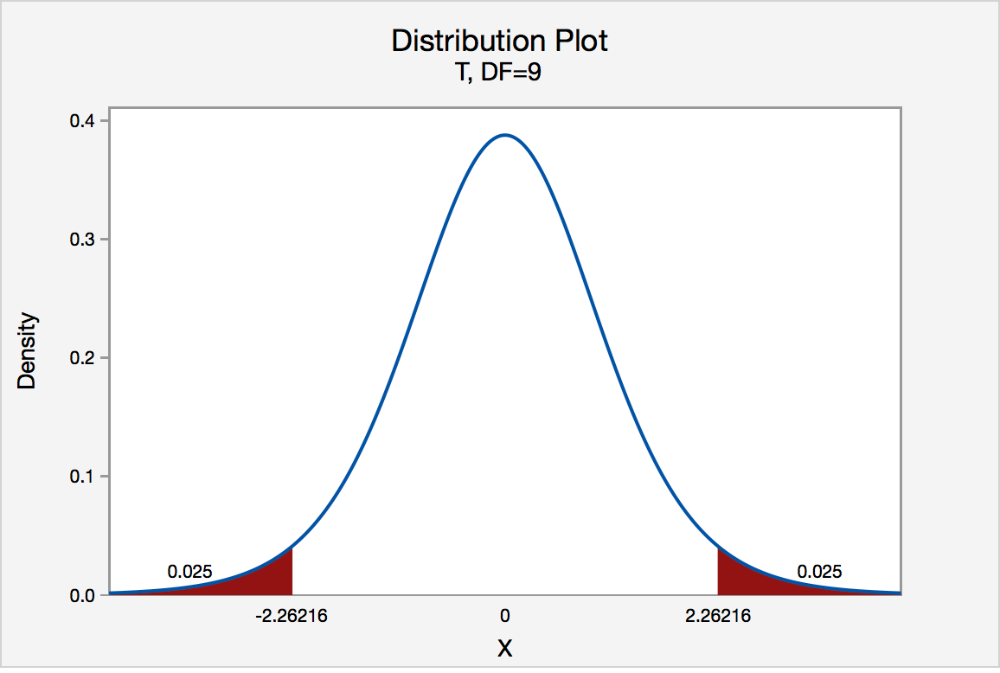

Since the quality control specialist's test statistic, $t* = 1.54$, is not less than -2.2616 nor greater than 2.2616, the quality control specialist fails to reject the null hypothesis. That is, the test statistic does not fall in the "critical region." There is insufficient evidence, at the $\alpha  = 0.05$ level, to conclude that the mean thickness of all of the manufacturer's spearmint gum differs from 7.5 one-hundredths of an inch.

If the quality control specialist used the P-value approach to conduct his hypothesis test, he would determine the area under a $t_{n - 1} = t_9$ curve, to the right of 1.54 and to the left of -1.54:

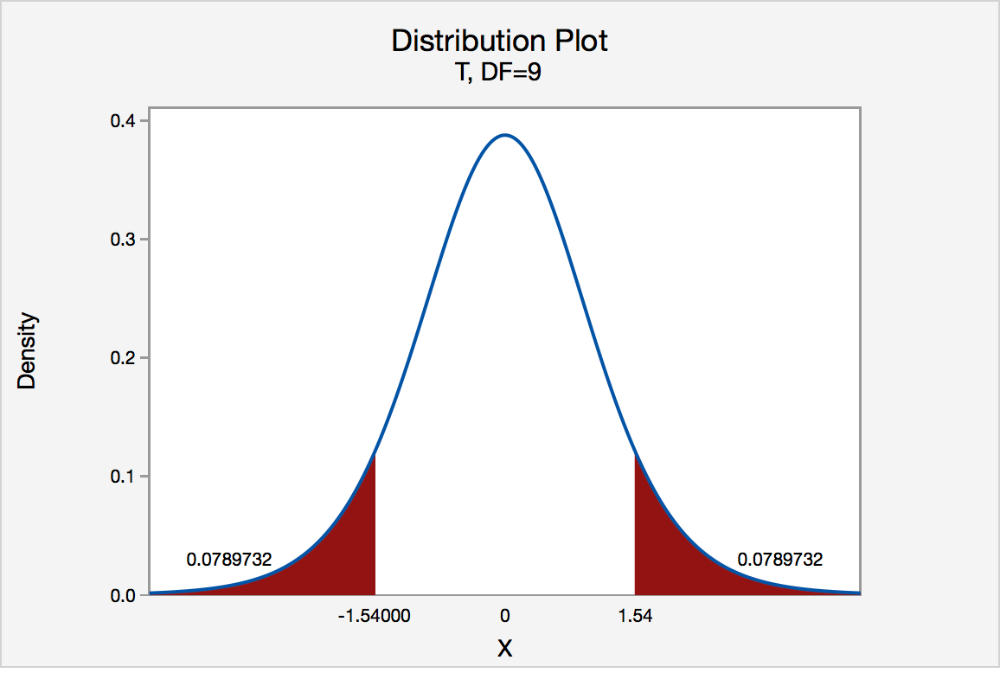

In the output above, Minitab reports that the P-value is 0.158. Since the P-value, 0.158, is greater than $\alpha = 0.05$, the quality control specialist fails to reject the null hypothesis. There is insufficient evidence, at the  = 0.05 level, to conclude that the mean thickness of all pieces of spearmint gum differs from 7.5 one-hundredths of an inch.

<div style="background: #000;
            color: #FFF;
            margin: 0px;
            margin-bottom: 10px;
            padding: 10px 0px 20px 0px;
            text-align: center; 
                ">
    <h1>Unsupervised Learning</h1>
</div>

### What is unsupervised learning?
Unsupervised learning is the training of a machine using information that is neither classified nor labeled and allowing the algorithm to act on that information without guidance. Here the task of the machine is to group unsorted information according to similarities, patterns, and differences without any prior training of data. 

Unlike supervised learning, no teacher is provided that means no training will be given to the machine. Therefore the machine is restricted to find the hidden structure in unlabeled data by itself. 

For instance, suppose it is given an image having both dogs and cats which it has never seen. 

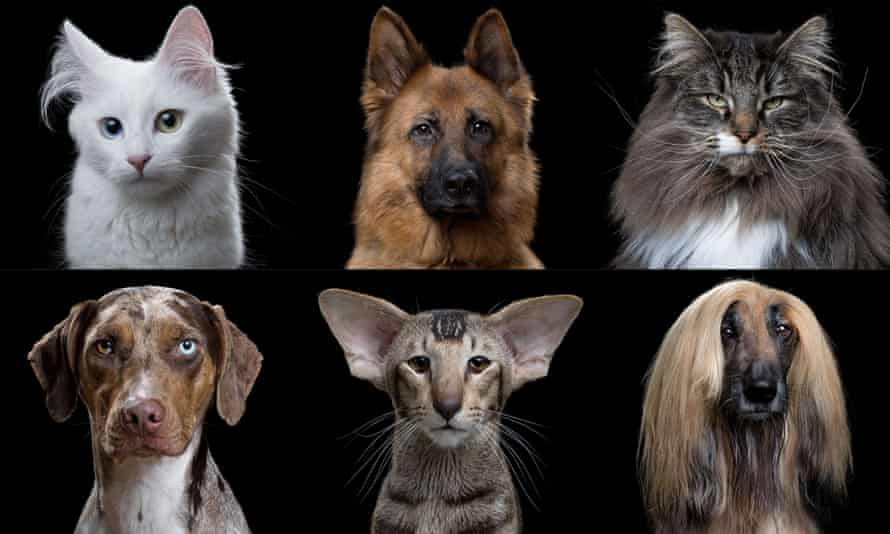

Thus the machine has no idea about the features of dogs and cats so we can’t categorize it as ‘dogs and cats ‘. But it can categorize them according to their similarities, patterns, and differences, i.e., we can easily categorize the above picture into two parts. The first may contain all pics having dogs in it and the second part may contain all pics having cats in it. Here you didn’t learn anything before, which means no training data or examples. 

 It allows the model to work on its own to discover patterns and information that was previously undetected. It mainly deals with unlabelled data.

Unsupervised learning is classified into three categories of algorithms: 
* Clustering -  is a data mining technique for grouping unlabeled data based on their similarities or differences. For example, K-means clustering algorithms assign similar data points into groups, where the K value represents the size of the grouping and granularity. This technique is helpful for market segmentation, image compression, etc.
* Association -  is another type of unsupervised learning method that uses different rules to find relationships between variables in a given dataset. These methods are frequently used for market basket analysis and recommendation engines, along the lines of “Customers Who Bought This Item Also Bought” recommendations.
* Dimensionality Reduction - is a learning technique used when the number of features (or dimensions) in a given dataset is too high. It reduces the number of data inputs to a manageable size while also preserving the data integrity. Often, this technique is used in the preprocessing data stage, such as when autoencoders remove noise from visual data to improve picture quality.

### Types of unsupervised learning algorithms
* K-Means Clustering - is a common example of an exclusive clustering method where data points are assigned into K groups, where K represents the number of clusters based on the distance from each group’s centroid. The data points closest to a given centroid will be clustered under the same category. A larger K value will be indicative of smaller groupings with more granularity whereas a smaller K value will have larger groupings and less granularity. K-means clustering is commonly used in market segmentation, document clustering, image segmentation, and image compression.
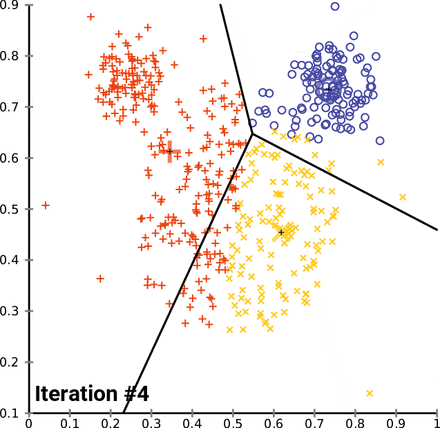
* Hierarchical Cluster Analysis - is an unsupervised clustering algorithm that can be categorized in two ways; they can be agglomerative or divisive. Agglomerative clustering is considered a “bottoms-up approach.” Its data points are isolated as separate groupings initially, and then they are merged together iteratively on the basis of similarity until one cluster has been achieved. Four different methods are commonly used to measure similarity:
  - Ward’s linkage: This method states that the distance between two clusters is defined by the increase in the sum of squared after the clusters are merged.
  - Average linkage: This method is defined by the mean distance between two points in each cluster
  - Complete (or maximum) linkage: This method is defined by the maximum distance between two points in each cluster
  - Single (or minimum) linkage: This method is defined by the minimum distance between two points in each cluster
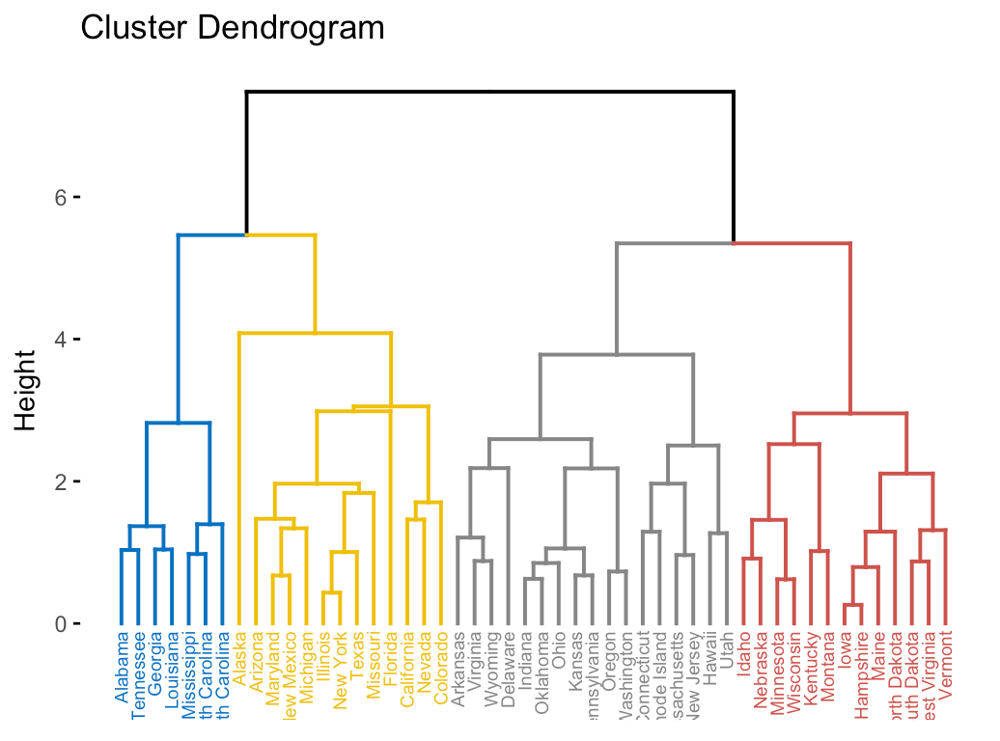
* Principal Component Analysis - Principal component analysis (PCA) is an unsupervised algorithm that creates linear combinations of the original features. The new features are orthogonal, which means that they are uncorrelated. Furthermore, they are ranked in order of their "explained variance." The first principal component (PC1) explains the most variance in your dataset, PC2 explains the second-most variance, and so on. Therefore, you can reduce dimensionality by limiting the number of principal components to keep based on cumulative explained variance. For example, you might decide to keep only as many principal components as needed to reach a cumulative explained variance of 90%. Essentially, Principal component analysis, or PCA, is a statistical procedure that allows you to summarize the information content in large data tables by means of a smaller set of “summary indices” that can be more easily visualized and analyzed.


### K Means Clustering Explained:

1. k initial "means" (in this case k=3) are randomly generated within the data domain (shown in color)
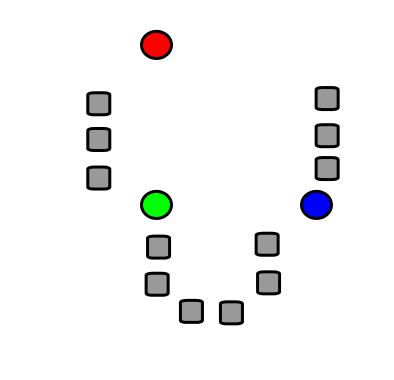
2. k clusters are created by associating every observation with the nearest mean. The partitions here represent the Voronoi diagram generated by the means. 
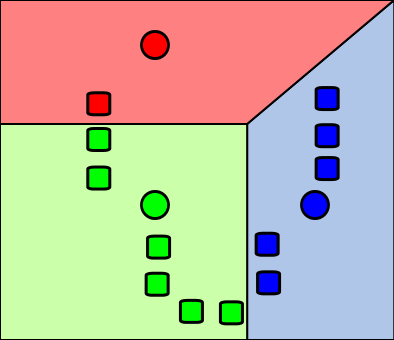
3. The centroid of each of the k clusters becomes the new mean. 
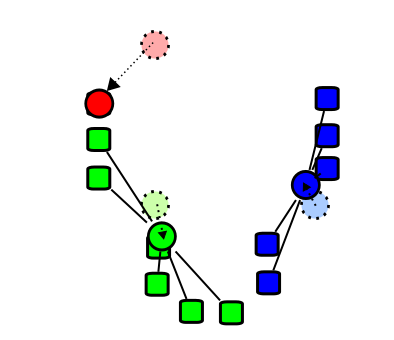
4. Steps 2 and 3 are repeated until convergence has been reached. 
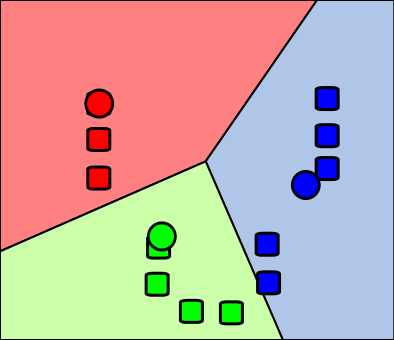

<div style="background: #000;
            color: #FFF;
            margin: 0px;
            margin-bottom: 10px;
            padding: 10px 0px 20px 0px;
            text-align: center; 
                ">
    <h1>K Means Clustering</h1> 
</div>

The following is adapted from: https://medium.com/data-folks-indonesia/step-by-step-to-understanding-k-means-clustering-and-implementation-with-sklearn-b55803f519d6

### Clustering

We've discussed how clustering works differently than classification in that instead of adjusting based on error metrics (since with classification we have output labels we can check for errors), clustering groups data based on similarity but what does that mean? Proximity. We consider two pieces of data as similar if, according to the features we're looking at, the distance is small.

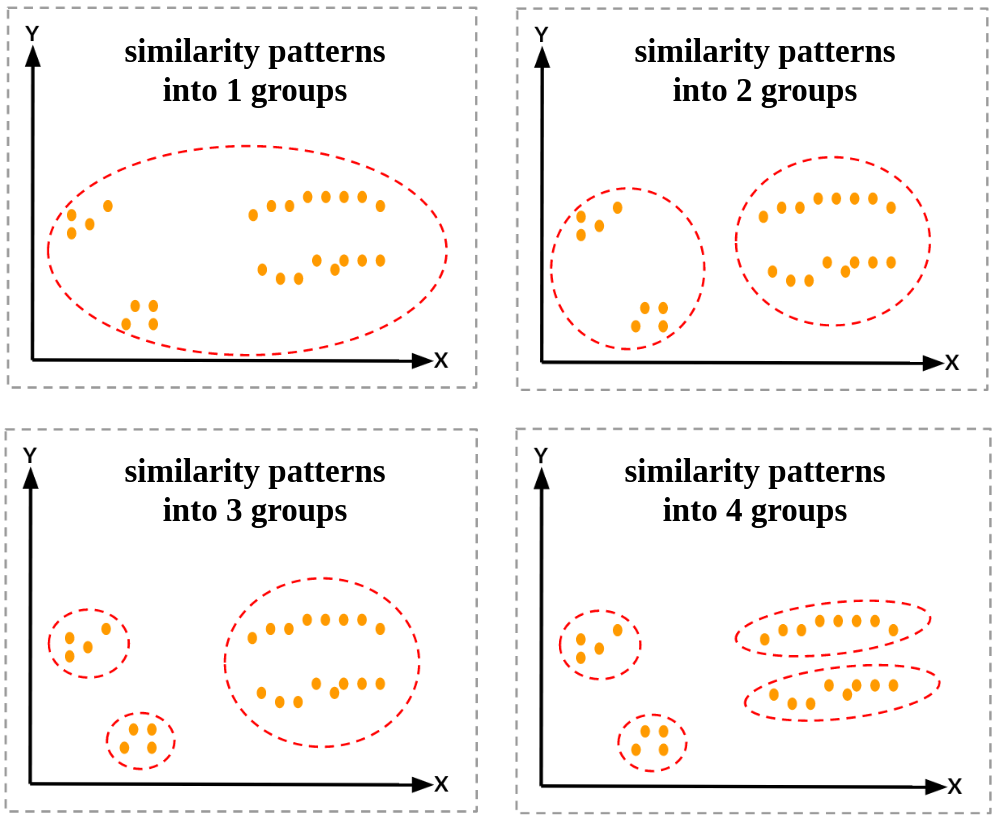

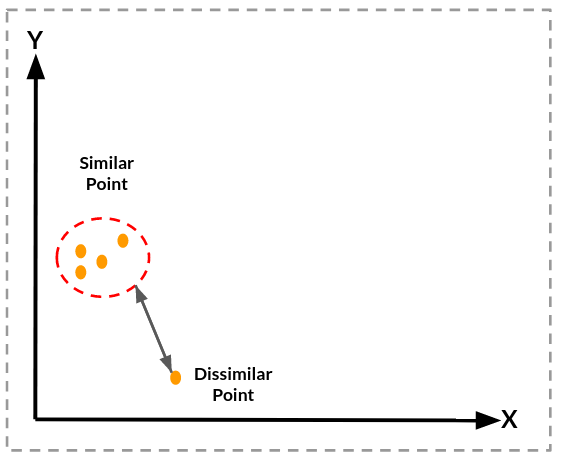

### So how does this work for K-Means clustering?

K-means clustering is a method of partitioning a data set into $K$ distinct, non-overlapping clusters. We must provide a number $K$ and then the algorithm will assign each observation into exactly one of the clusters.

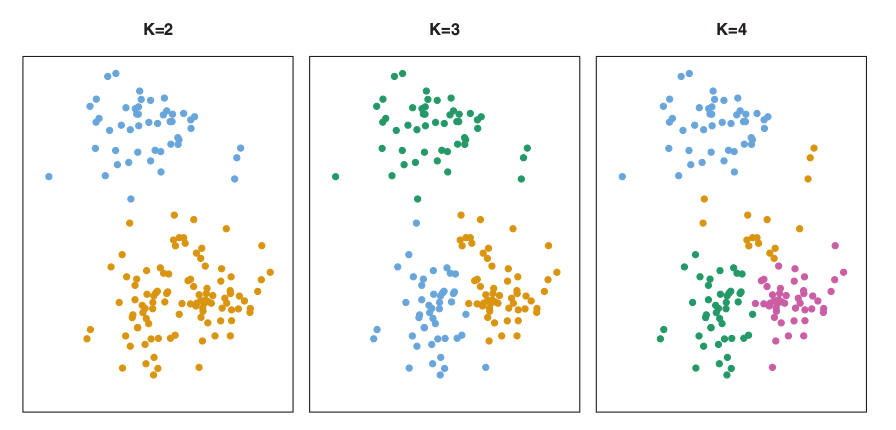

The K-means algorithm clusters data by trying to separate samples in $n$ groups of equal variance, minimizing a criterion known as inertia or within-cluster sum-of-squares. The K-means algorithm aims to choose a centroid that minimizes the inertia or within-cluster sum-of-squares criterion.

$$ \sum_{i=0}^{n}\min_{\mu \in C}(||x_i - \mu_j ||^{2})$$

Step 1. Determine $k$, the number of clusters.

Let's assume $k=3$ for now.

Step 2. Randomly generate $k$ distinct centroids

If $k=3$, then we generate 3 centroids.

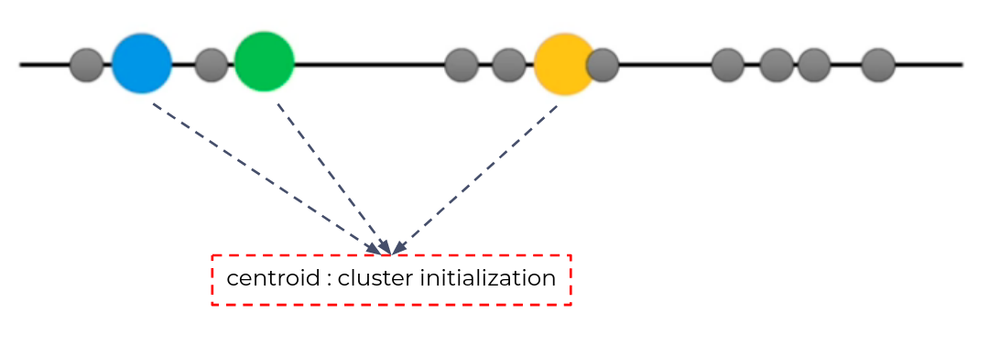

Step 3. Measure the euclidean distance between each point and centroid.

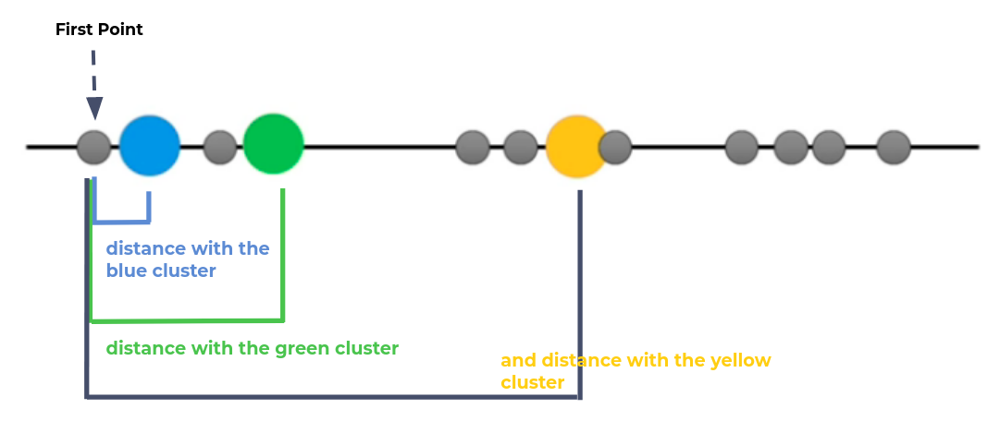

Step 4. Assign each point to the nearest cluster.

Group points based on distance/proximity to centroid.

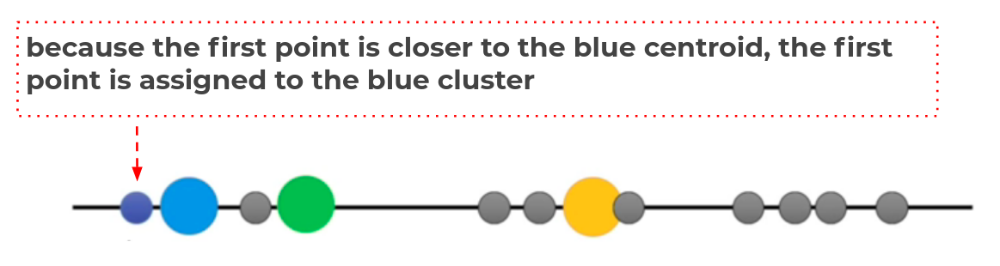

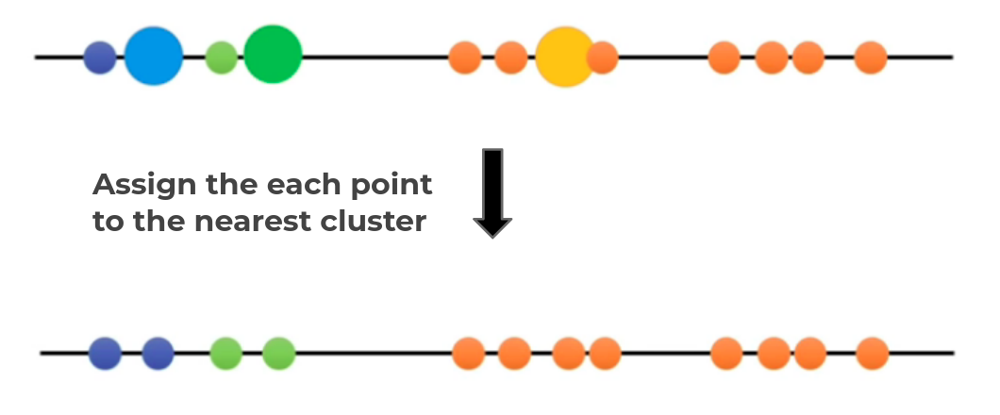

Step 5. Update the centroid using the mean of each cluster.

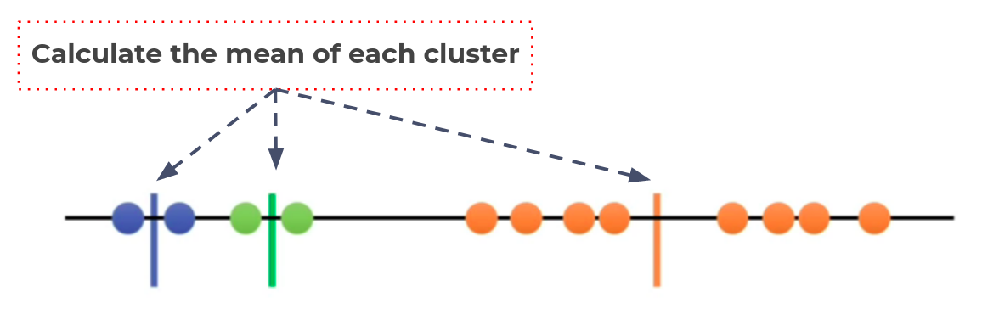

Step 6. Repeat steps 3-5 with the new centroid.

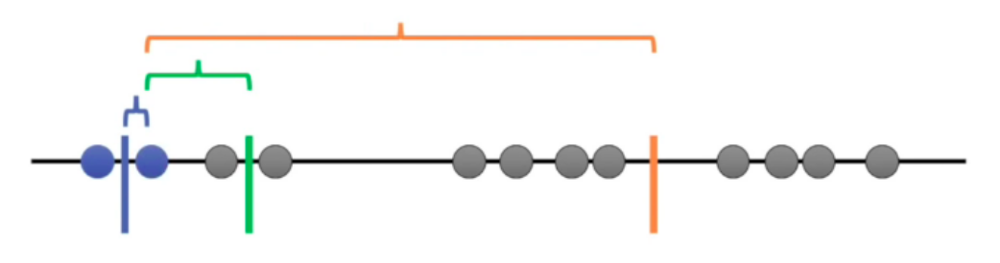

Repeat until:
* Convergence (further iterations don't result in changes)
* Maximum number of iterations

If our cluster ends up converging to below, we continue our process.

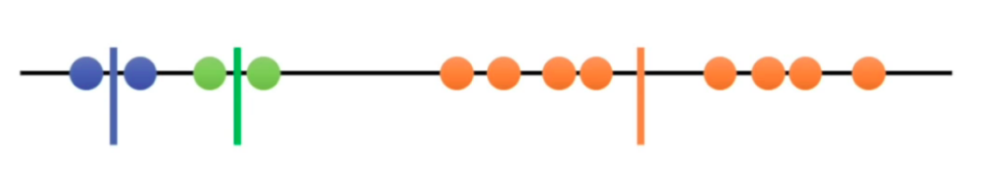

Step 7. Measure the variance.

We would like to minimum within-cluster sum-of-squares which is essentially variance. So we need to calculate our variance and see how it fares.

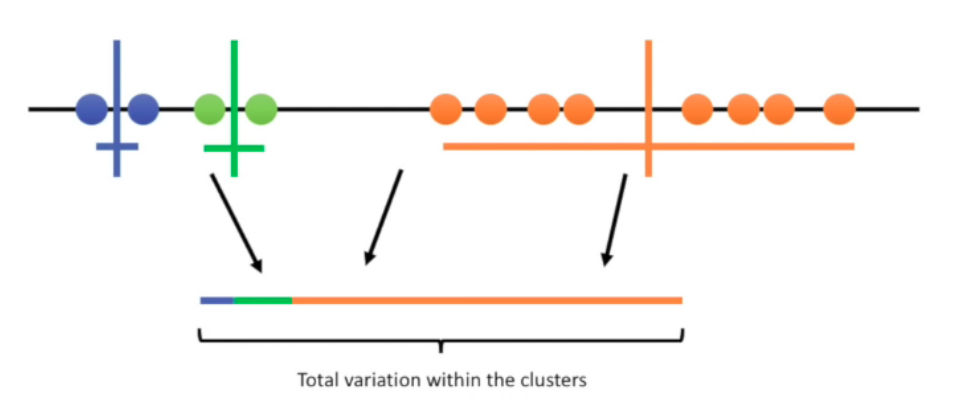

Since we don't know what the "answer" is, the algorithm keeps track of these values as it repeats the entire process attempting to minimum variance.

Step 8. Repeat step 2-7 until we get the lowest sum of variance.

The algorithm repeats the steps with random centroids.

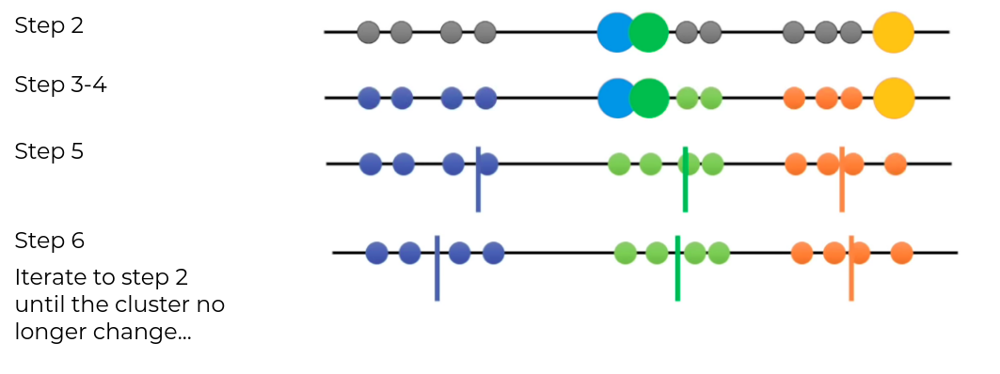

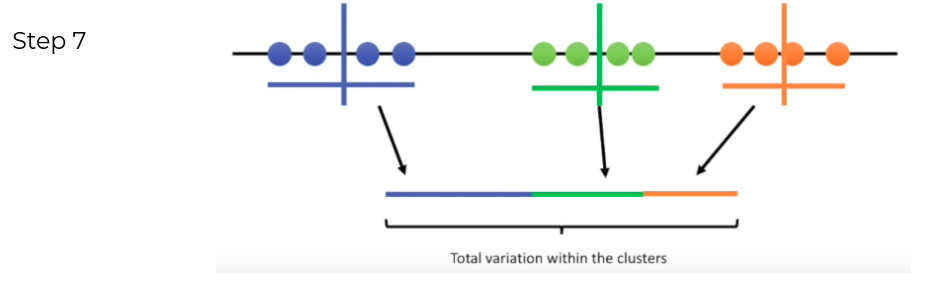

This repeats until we get to the previous stop conditions:
* Convergence (further iterations don't result in changes)
* Maximum number of iterations

Then the attemp with the lowest within-cluster sum-of-squares is chosen as the result.

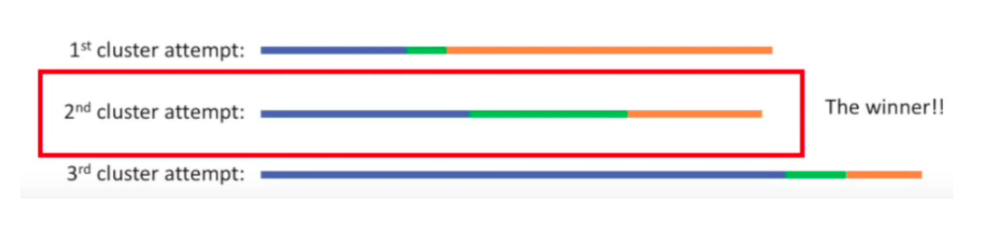

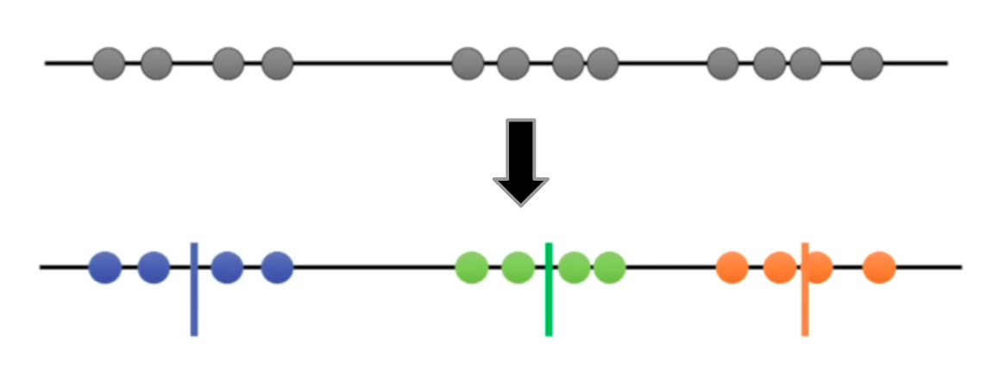

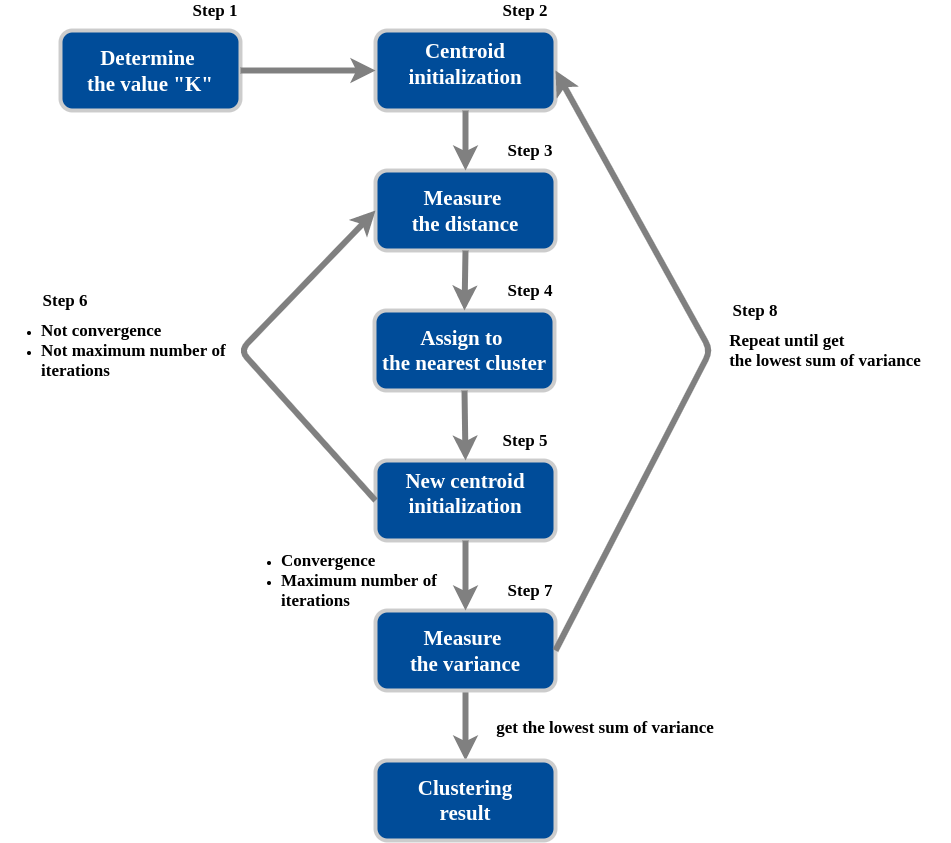



In [40]:
df = pd.read_csv('../datasets/mall_customers.csv')

In [41]:
df.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


In [42]:
'columns: ' + ', '.join(df.columns)

'columns: CustomerID, Gender, Age, Annual Income (k$), Spending Score (1-100)'

In [43]:
df.dtypes

CustomerID                 int64
Gender                    object
Age                        int64
Annual Income (k$)         int64
Spending Score (1-100)     int64
dtype: object

In [44]:
df.isnull().sum()

CustomerID                0
Gender                    0
Age                       0
Annual Income (k$)        0
Spending Score (1-100)    0
dtype: int64

In [46]:
df['Age'].mean()

38.85

In [47]:
# very simple k-means clustering

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

dfa = df[['Age','Annual Income (k$)']]

print('Total Row : ', len(dfa))## Feature Scaling
dfa.head()

Total Row :  200


,Age,Annual Income (k$)
0,19,15
1,21,15
2,20,16
3,23,16
4,31,17


In [52]:
# this creates a standard scaler
sc_dfa = StandardScaler()

# this scales our df to a standard scale (0 mean and unit variance)
dfa_std = sc_dfa.fit_transform(dfa.astype(float))## Clustering with KMeans
dfa_std

array([[-1.42456879, -1.73899919],
       [-1.28103541, -1.73899919],
       [-1.3528021 , -1.70082976],
       [-1.13750203, -1.70082976],
       [-0.56336851, -1.66266033],
       [-1.20926872, -1.66266033],
       [-0.27630176, -1.62449091],
       [-1.13750203, -1.62449091],
       [ 1.80493225, -1.58632148],
       [-0.6351352 , -1.58632148],
       [ 2.02023231, -1.58632148],
       [-0.27630176, -1.58632148],
       [ 1.37433211, -1.54815205],
       [-1.06573534, -1.54815205],
       [-0.13276838, -1.54815205],
       [-1.20926872, -1.54815205],
       [-0.27630176, -1.50998262],
       [-1.3528021 , -1.50998262],
       [ 0.94373197, -1.43364376],
       [-0.27630176, -1.43364376],
       [-0.27630176, -1.39547433],
       [-0.99396865, -1.39547433],
       [ 0.51313183, -1.3573049 ],
       [-0.56336851, -1.3573049 ],
       [ 1.08726535, -1.24279661],
       [-0.70690189, -1.24279661],
       [ 0.44136514, -1.24279661],
       [-0.27630176, -1.24279661],
       [ 0.08253169,

In [54]:
kmeans = KMeans(n_clusters=3, random_state=42).fit(dfa_std)

labels = kmeans.labels_

new_dfa = pd.DataFrame(data = dfa_std, columns = ['Age','Annual Income (k$)'])
new_dfa['label_kmeans'] = labels

new_dfa.tail()

,Age,Annual Income (k$),label_kmeans
195,-0.276302,2.268791,2
196,0.441365,2.497807,2
197,-0.491602,2.497807,2
198,-0.491602,2.917671,2
199,-0.635135,2.917671,2


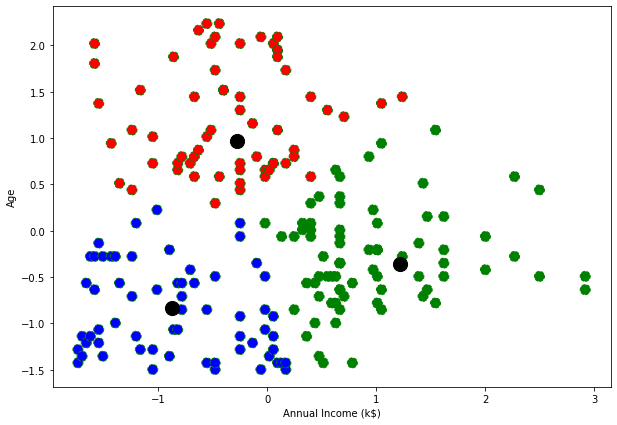

In [55]:
fig, ax = plt.subplots(figsize=(10,7))

plt.scatter(new_dfa["Annual Income (k$)"][new_dfa["label_kmeans"] == 0], new_dfa["Age"][new_dfa["label_kmeans"] == 0], 
            color = "blue", s=100, edgecolor='green',linestyle='--')

plt.scatter(new_dfa["Annual Income (k$)"][new_dfa["label_kmeans"] == 1], new_dfa["Age"][new_dfa["label_kmeans"] == 1], 
            color = "red", s=100, edgecolor='green',linestyle='--')

plt.scatter(new_dfa["Annual Income (k$)"][new_dfa["label_kmeans"] == 2], new_dfa["Age"][new_dfa["label_kmeans"] == 2], 
            color = "green", s=100, edgecolor='green',linestyle='--')

centers = kmeans.cluster_centers_

plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200)

ax.set_xlabel('Annual Income (k$)')
ax.set_ylabel('Age')

plt.show()

Total Row :  200


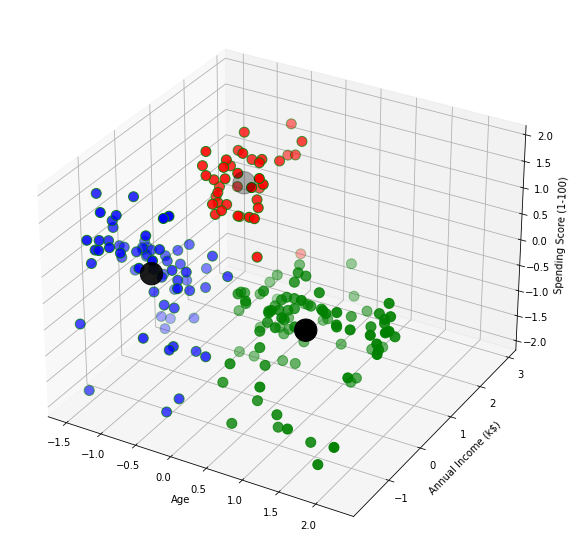

In [56]:
# very simple 3 feature k-means clustering

dfa = df[['Age','Annual Income (k$)','Spending Score (1-100)']]
print('Total Row : ', len(dfa))## Feature Scaling
sc_dfa = StandardScaler()

dfa_std = sc_dfa.fit_transform(dfa.astype(float))## Clustering with KMeans

kmeans = KMeans(n_clusters=3, random_state=42).fit(dfa_std)

labels = kmeans.labels_
new_dfa = pd.DataFrame(data = dfa_std, columns = ['Age','Annual Income (k$)','Spending Score (1-100)'])

new_dfa['label_kmeans'] = labels

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111, projection='3d')

ax.scatter(new_dfa.Age[new_dfa.label_kmeans == 0], new_dfa["Annual Income (k$)"][new_dfa.label_kmeans == 0], new_dfa["Spending Score (1-100)"][new_dfa.label_kmeans == 0], c='blue', s=100, edgecolor='green',linestyle='-')
ax.scatter(new_dfa.Age[new_dfa.label_kmeans == 1], new_dfa["Annual Income (k$)"][new_dfa.label_kmeans == 1], new_dfa["Spending Score (1-100)"][new_dfa.label_kmeans == 1], c='red', s=100, edgecolor='green',linestyle='-')
ax.scatter(new_dfa.Age[new_dfa.label_kmeans == 2], new_dfa["Annual Income (k$)"][new_dfa.label_kmeans == 2], new_dfa["Spending Score (1-100)"][new_dfa.label_kmeans == 2], c='green', s=100, edgecolor='green',linestyle='-')
ax.scatter(new_dfa.Age[new_dfa.label_kmeans == 3], new_dfa["Annual Income (k$)"][new_dfa.label_kmeans == 3], new_dfa["Spending Score (1-100)"][new_dfa.label_kmeans == 3], c='orange', s=100, edgecolor='green',linestyle='-')
ax.scatter(new_dfa.Age[new_dfa.label_kmeans == 4], new_dfa["Annual Income (k$)"][new_dfa.label_kmeans == 4], new_dfa["Spending Score (1-100)"][new_dfa.label_kmeans == 4], c='purple', s=100, edgecolor='green',linestyle='-')

centers = kmeans.cluster_centers_

ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], c='black', s=500);

plt.xlabel("Age")
plt.ylabel("Annual Income (k$)")
ax.set_zlabel('Spending Score (1-100)')
plt.show()

The following is taken from:
https://www.kaggle.com/kushal1996/customer-segmentation-k-means-analysis/notebook

In [57]:
plt.style.use('fivethirtyeight')

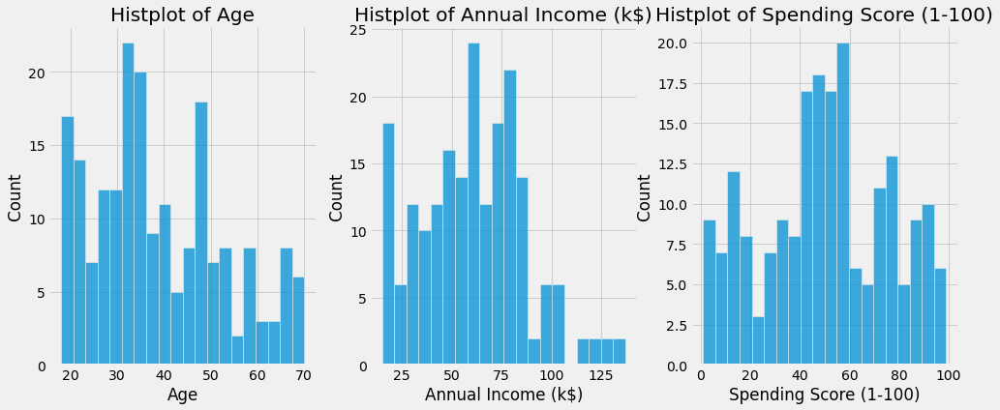

In [58]:
df = pd.read_csv('../datasets/mall_customers.csv')
plt.figure(1 , figsize = (15 , 6))
n = 0 
for x in ['Age' , 'Annual Income (k$)' , 'Spending Score (1-100)']:
    n += 1
    plt.subplot(1 , 3 , n)
    sns.histplot(df[x] , bins = 20)
    plt.title('Histplot of {}'.format(x))
plt.show()

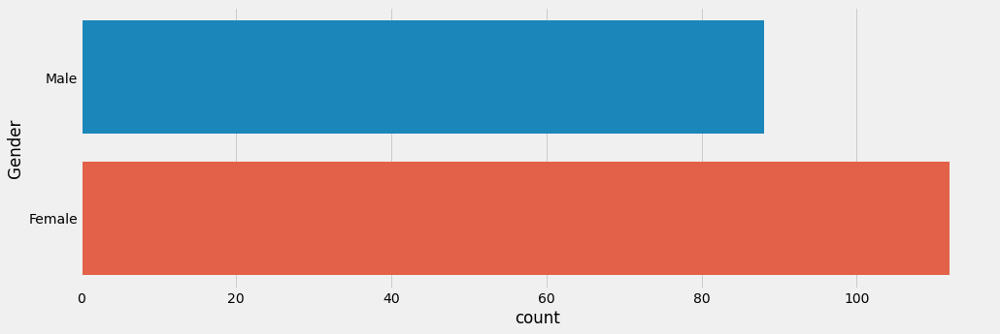

In [59]:
plt.figure(1 , figsize = (15 , 5))
sns.countplot(y = 'Gender' , data = df)
plt.show()

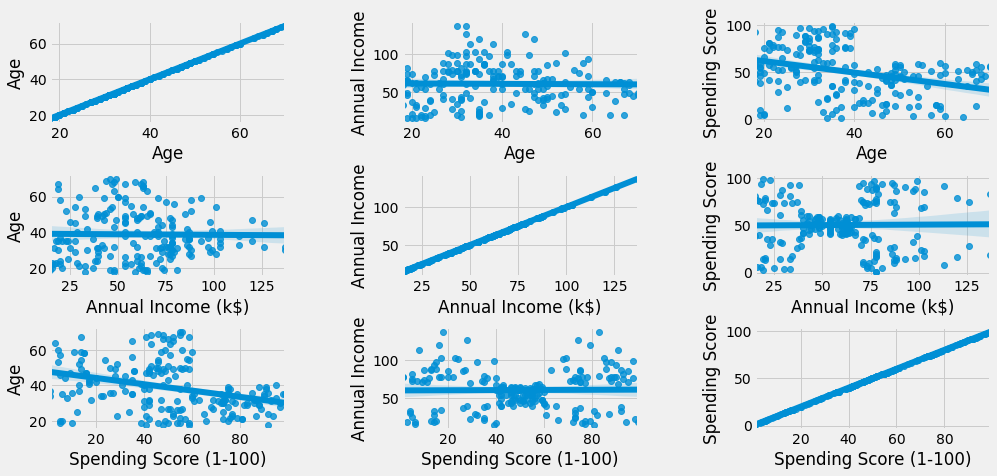

In [60]:
plt.figure(1 , figsize = (15 , 7))
n = 0 
for x in ['Age' , 'Annual Income (k$)' , 'Spending Score (1-100)']:
    for y in ['Age' , 'Annual Income (k$)' , 'Spending Score (1-100)']:
        n += 1
        plt.subplot(3 , 3 , n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
        sns.regplot(x = x , y = y , data = df)
        plt.ylabel(y.split()[0]+' '+y.split()[1] if len(y.split()) > 1 else y )
plt.show()

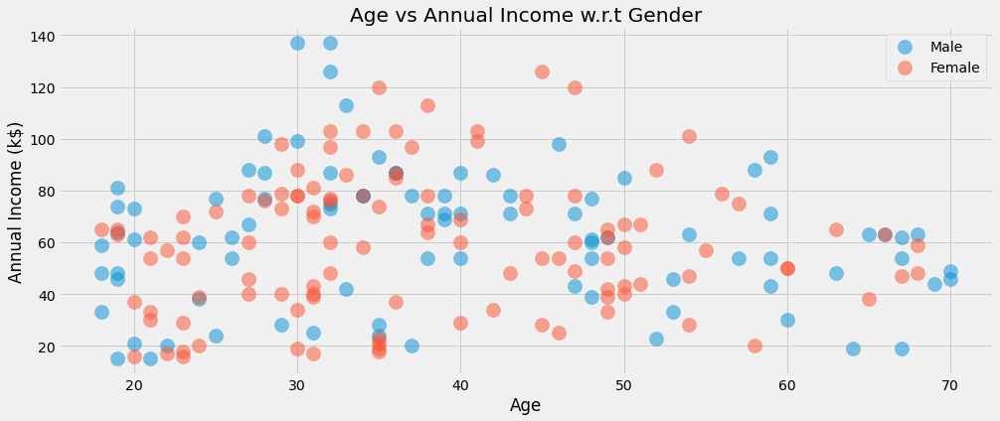

In [61]:
plt.figure(1 , figsize = (15 , 6))
for gender in ['Male' , 'Female']:
    plt.scatter(x = 'Age' , y = 'Annual Income (k$)' , data = df[df['Gender'] == gender] ,
                s = 200 , alpha = 0.5 , label = gender)
plt.xlabel('Age'), plt.ylabel('Annual Income (k$)') 
plt.title('Age vs Annual Income w.r.t Gender')
plt.legend()
plt.show()

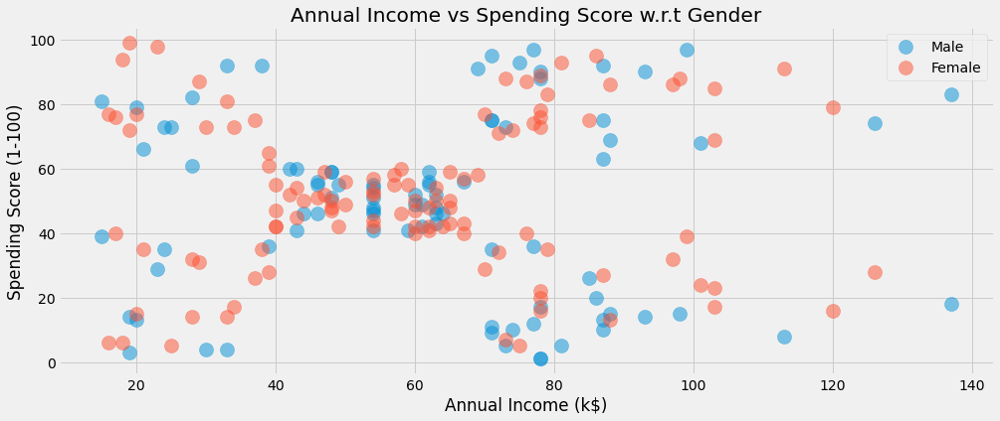

In [62]:
plt.figure(1 , figsize = (15 , 6))
for gender in ['Male' , 'Female']:
    plt.scatter(x = 'Annual Income (k$)',y = 'Spending Score (1-100)' ,
                data = df[df['Gender'] == gender] ,s = 200 , alpha = 0.5 , label = gender)
plt.xlabel('Annual Income (k$)'), plt.ylabel('Spending Score (1-100)') 
plt.title('Annual Income vs Spending Score w.r.t Gender')
plt.legend()
plt.show()

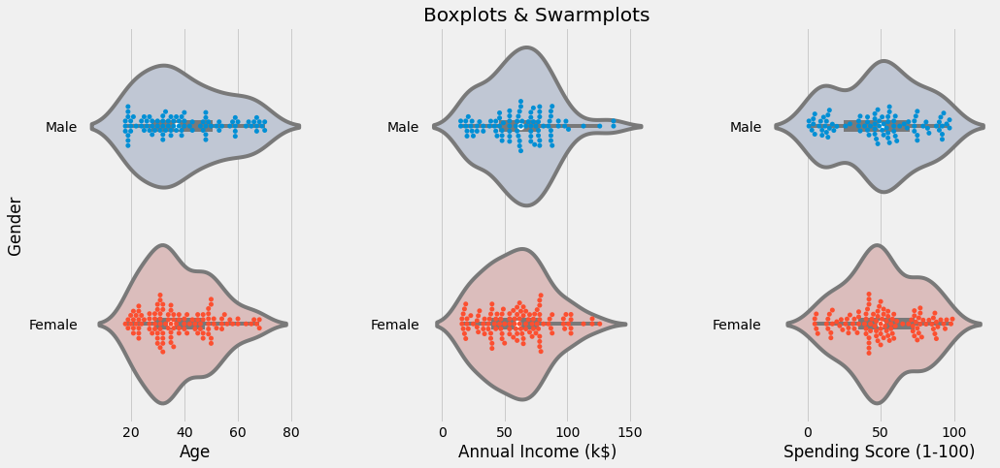

In [65]:
plt.figure(1 , figsize = (15 , 7))
n = 0 
for cols in ['Age' , 'Annual Income (k$)' , 'Spending Score (1-100)']:
    n += 1 
    plt.subplot(1 , 3 , n)
    plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
    sns.violinplot(x = cols , y = 'Gender' , data = df , palette = 'vlag')
    sns.swarmplot(x = cols , y = 'Gender' , data = df)
    plt.ylabel('Gender' if n == 1 else '')
    plt.title('Boxplots & Swarmplots' if n == 2 else '')
plt.show()

In [66]:
from sklearn.cluster import KMeans

'''Age and spending Score'''
X1 = df[['Age' , 'Spending Score (1-100)']].iloc[: , :].values
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='full') )
    algorithm.fit(X1)
    inertia.append(algorithm.inertia_)

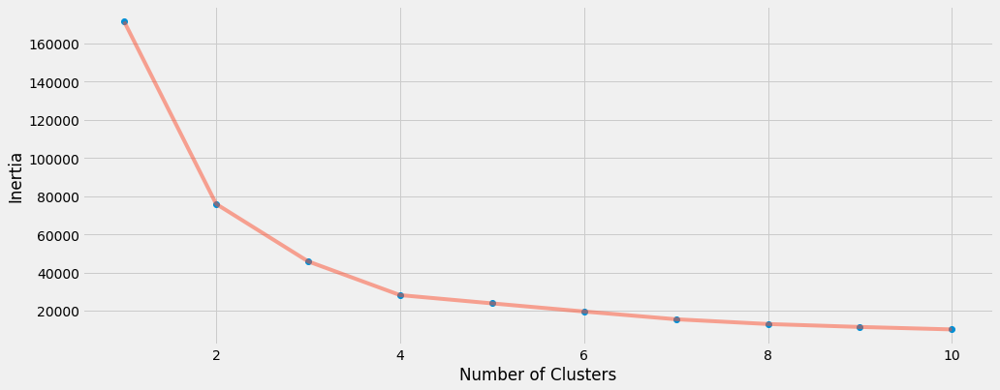

In [67]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [68]:
algorithm = (KMeans(n_clusters = 4 ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='full') )
algorithm.fit(X1)
labels1 = algorithm.labels_
centroids1 = algorithm.cluster_centers_

In [69]:
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = algorithm.predict(np.c_[xx.ravel(), yy.ravel()]) 

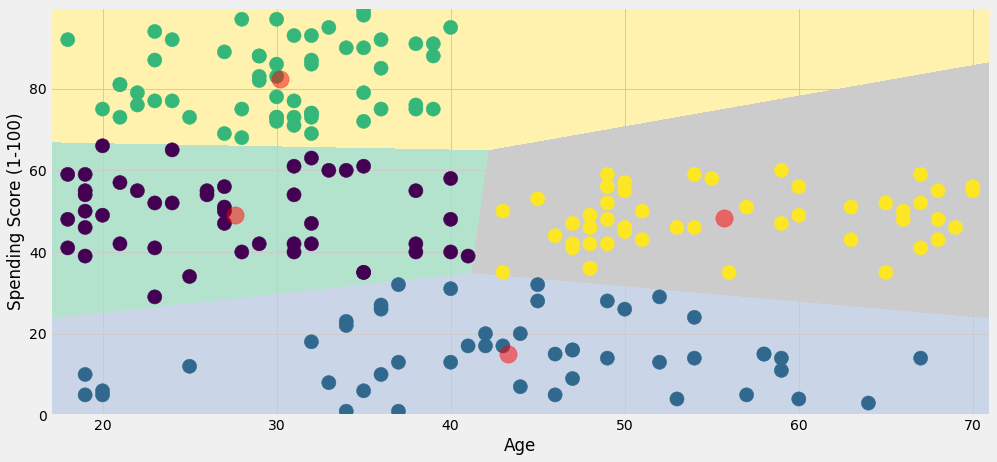

In [70]:
plt.figure(1 , figsize = (15 , 7) )
plt.clf()
Z = Z.reshape(xx.shape)
plt.imshow(Z , interpolation='nearest', 
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel2, aspect = 'auto', origin='lower')

plt.scatter( x = 'Age' ,y = 'Spending Score (1-100)' , data = df , c = labels1 , 
            s = 200 )
plt.scatter(x = centroids1[: , 0] , y =  centroids1[: , 1] , s = 300 , c = 'red' , alpha = 0.5)
plt.ylabel('Spending Score (1-100)') , plt.xlabel('Age')
plt.show()

In [71]:
'''Annual Income and spending Score'''
X2 = df[['Annual Income (k$)' , 'Spending Score (1-100)']].iloc[: , :].values
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='full') )
    algorithm.fit(X2)
    inertia.append(algorithm.inertia_)

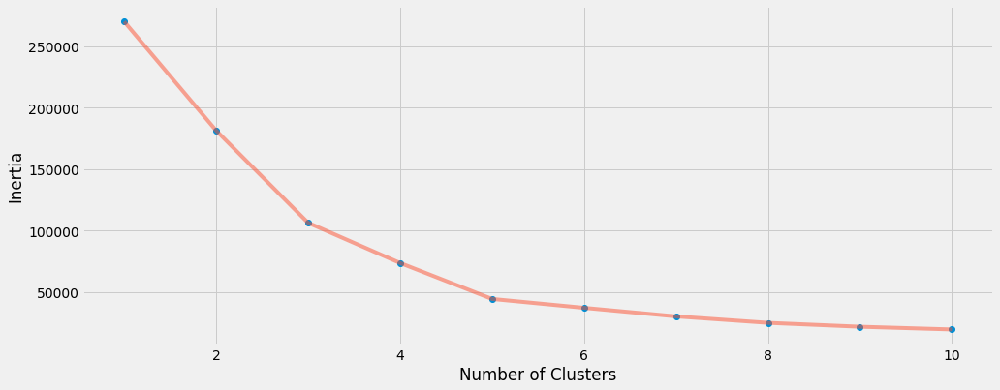

In [72]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [73]:
algorithm = (KMeans(n_clusters = 5 ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
algorithm.fit(X2)
labels2 = algorithm.labels_
centroids2 = algorithm.cluster_centers_

In [74]:
h = 0.02
x_min, x_max = X2[:, 0].min() - 1, X2[:, 0].max() + 1
y_min, y_max = X2[:, 1].min() - 1, X2[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z2 = algorithm.predict(np.c_[xx.ravel(), yy.ravel()]) 

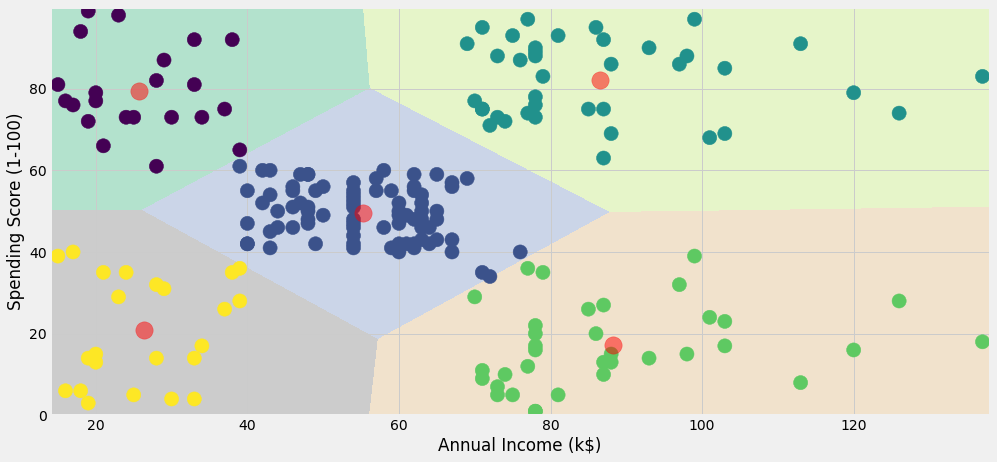

In [75]:
plt.figure(1 , figsize = (15 , 7) )
plt.clf()
Z2 = Z2.reshape(xx.shape)
plt.imshow(Z2 , interpolation='nearest', 
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel2, aspect = 'auto', origin='lower')

plt.scatter( x = 'Annual Income (k$)' ,y = 'Spending Score (1-100)' , data = df , c = labels2 , 
            s = 200 )
plt.scatter(x = centroids2[: , 0] , y =  centroids2[: , 1] , s = 300 , c = 'red' , alpha = 0.5)
plt.ylabel('Spending Score (1-100)') , plt.xlabel('Annual Income (k$)')
plt.show()

In [76]:
X3 = df[['Age' , 'Annual Income (k$)' ,'Spending Score (1-100)']].iloc[: , :].values
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='full') )
    algorithm.fit(X3)
    inertia.append(algorithm.inertia_)

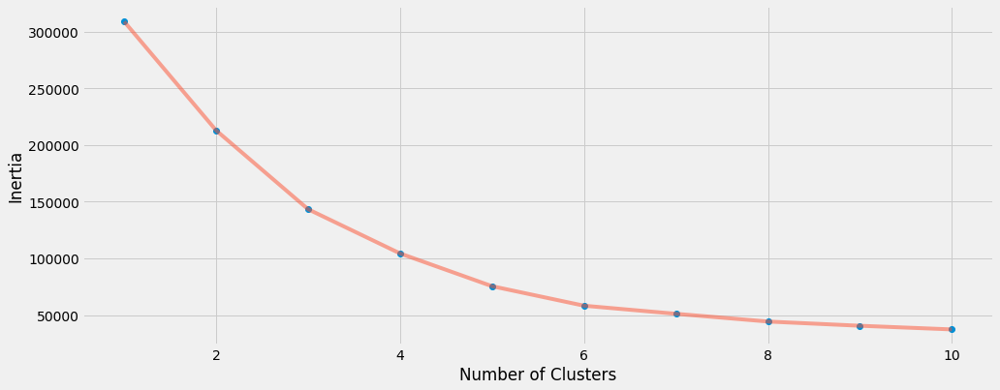

In [77]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [78]:
algorithm = (KMeans(n_clusters = 6 ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
algorithm.fit(X3)
labels3 = algorithm.labels_
centroids3 = algorithm.cluster_centers_

In [85]:
import plotly as py
import plotly.graph_objs as go

df['label3'] =  labels3
trace1 = go.Scatter3d(
    x= df['Age'],
    y= df['Spending Score (1-100)'],
    z= df['Annual Income (k$)'],
    mode='markers',
     marker=dict(
        color = df['label3'], 
        size= 20,
        line=dict(
            color= df['label3'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    ),
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Age'),
            yaxis = dict(title  = 'Spending Score'),
            zaxis = dict(title  = 'Annual Income')
        )
)
fig = go.Figure(data=data, layout=layout)
fig.show()

<div style="background: #000;
            color: #FFF;
            margin: 0px;
            margin-bottom: 10px;
            padding: 10px 0px 20px 0px;
            text-align: center; ">
    <h1>Dimensionality Reduction</h1> 
</div>

seperateThere were three main approaches to unsupervised learning:
* clustering
* anomoly detection
* dimensionality reduction

**"Dimensionality reduction is the transformation of data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data, ideally close to its intrinsic dimension. Working in high-dimensional spaces can be undesirable for many reasons; raw data are often sparse as a consequence of the curse of dimensionality, and analyzing the data is usually computationally intractable. Dimensionality reduction is common in fields that deal with large numbers of observations and/or large numbers of variables, such as signal processing, speech recognition, neuroinformatics, and bioinformatics."**

source: [wikipedia](https://en.wikipedia.org/wiki/Dimensionality_reduction)

Dimensions:
univariate - one variable  
bivariate - two variables  
multivariate - three or more variables  

We can think of dimensions like so.

$\mathbf{R}$ - would be real numbers in one dimension.

$$1.00, 2.32, 5.7 $$

$\mathbf{I}$ - would be integers in one dimension.

$$ 1, 2, 5 $$

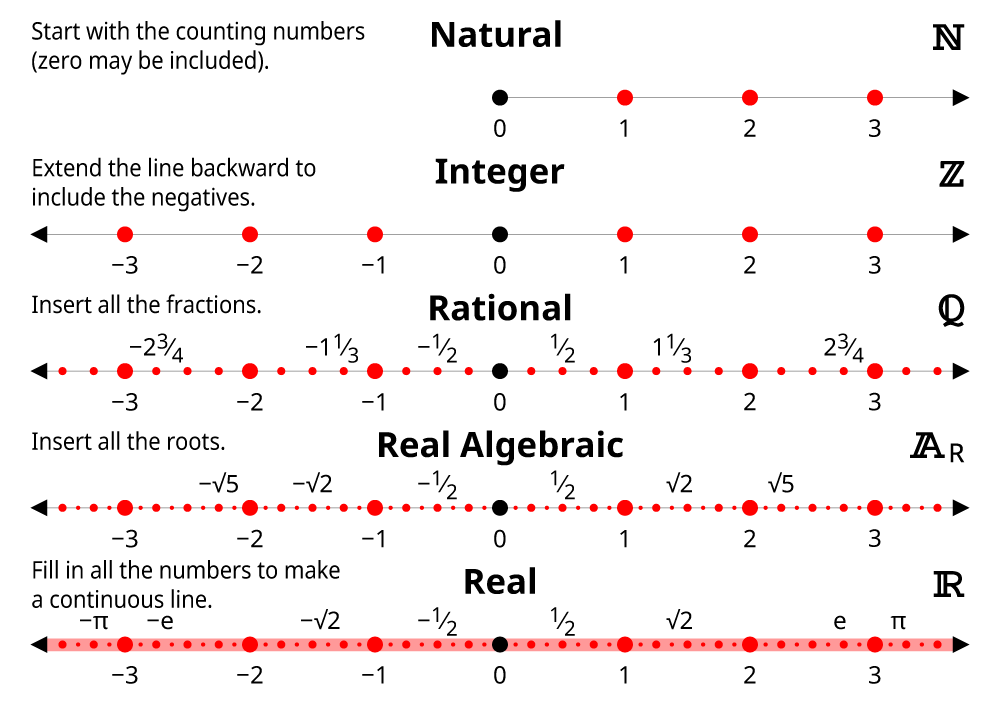

$\mathbf{R^{2}}$ - would be real numbers in two dimensions

$$  (-3.0,1.0), (-1.5,-2.5), (0.0,0.0), (2.0,4.0) $$

$\mathbf{I^2}$ - would be integers in two dimension.

$$ (-3,1), (-1,-2), (0,0), (2,4) $$

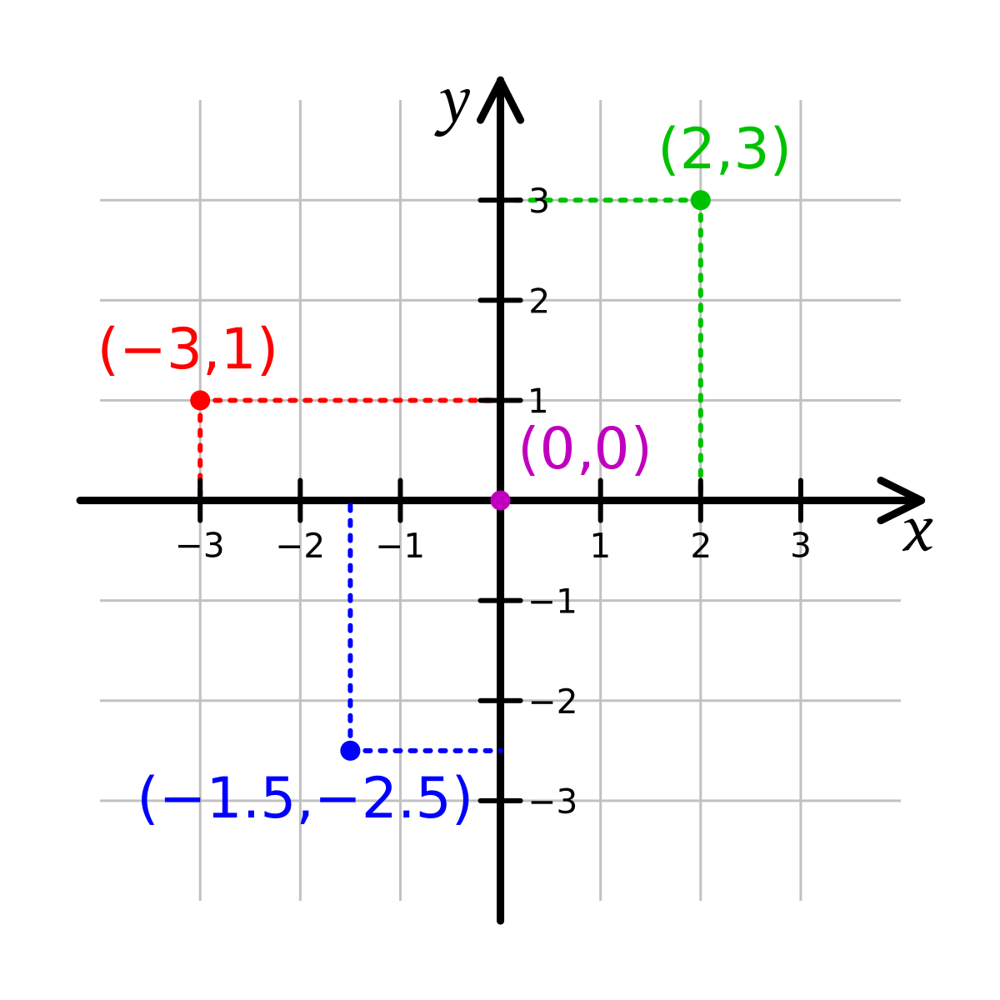

$\mathbf{R^{3}}$ - would be real numbers in three dimensions

$$ (-2.4,3.2,5.4), (1.6,2.4,6.3), (8.0,8.8,8.4) $$

$\mathbf{I^3}$ - would be integers in three dimension.

$$ (-3,1,-2), (-1.5,-2.5,2), (0,0), (2,4) $$

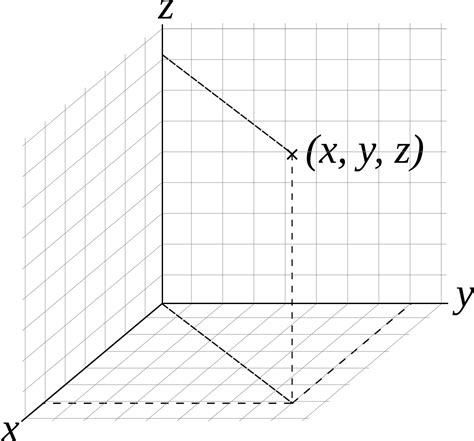

$\mathbf{R^{n}}$ - would be real numbers in $n$ dimensions
$\mathbf{I^n}$ - would be integers in $n$ dimension.

$$ (a_1, a_2, ..., a_n), (b_1, b_2, ..., b_n), (c_1, c_2, ..., c_n) $$

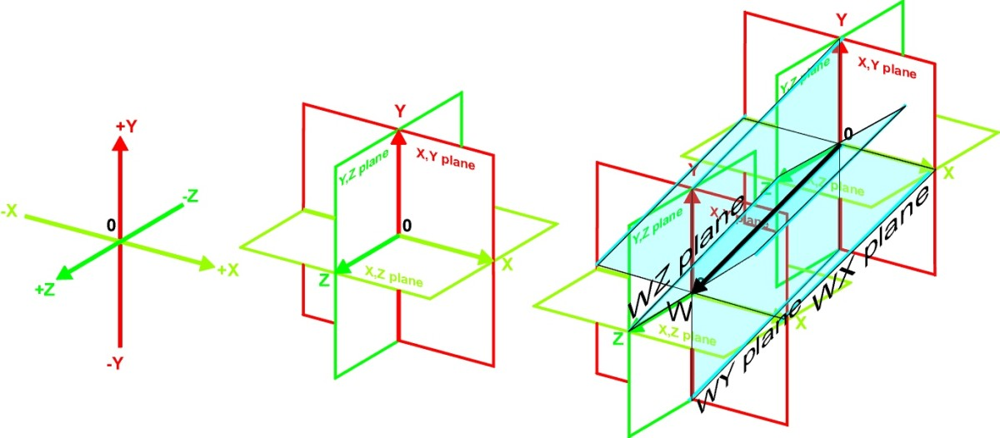

Higher dimensions don't make sense to humans. If we can take higher dimension data and transform it into lower dimensional data, while keeping its intrinsic properties, it will be easier to work with the data.

There is also the **"curse of dimensionality"**. In this context, it means as we have higher dimensions in our features and more complicated data, there is an exponential growth in storage space and processing times. Infinite features would require infinite training. There is also more sparseness in our data.

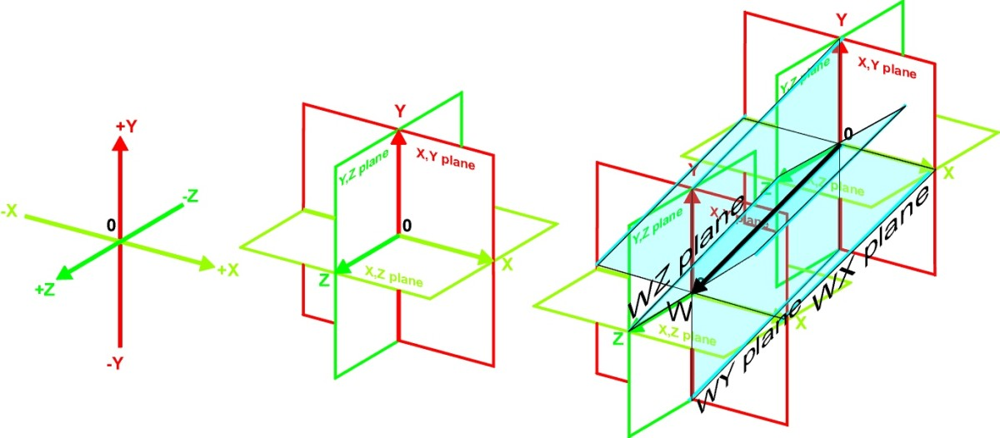

### A simple example of high dimension data cursing us.

[excepted from here](https://towardsdatascience.com/the-curse-of-dimensionality-50dc6e49aa1e)

Imagine our dataset consists of the following 8 candies.

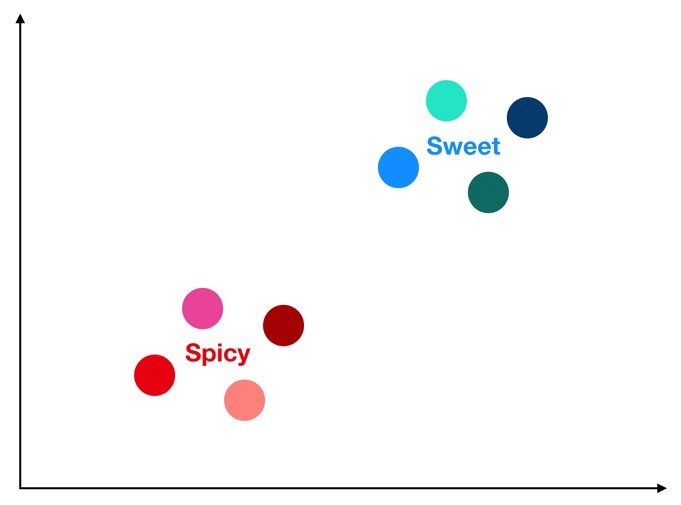

The ground truth is that there are two clusters within our dataset of 8 candies — spicy and sweet. So if all we cared about was getting the flavor right, how could we cluster our candies to ensure that we never accidentally give a spicy candy to our friend with the sweet tooth?

We can cluster by color like so:

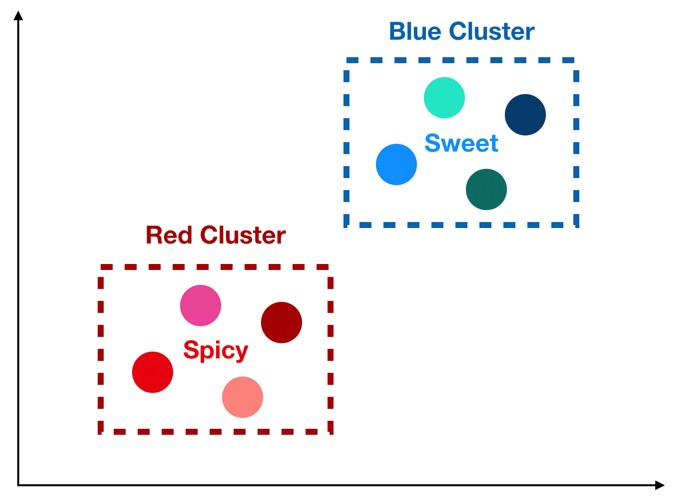

Nice, thanks to our clustering we know that if we eat a reddish candy, it will be spicy; and if we eat a bluish candy, it will be sweet.

But actually it’s not that simple. As humans we are able to visually inspect the candies and quickly decide that red means spicy and blue means sweet. But a machine learning algorithm can only do so if the data is presented to it properly. If our data looks like the following table, then we are in luck — we have two features, reddish and bluish that produce perfect clusters of taste giving us a perfect model.

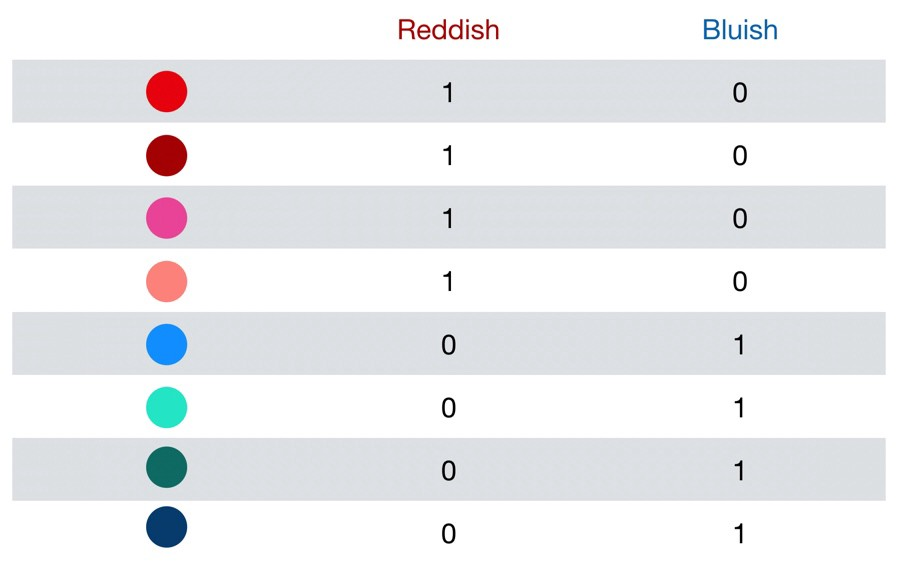

But what if our data is high dimensional like in the next table?

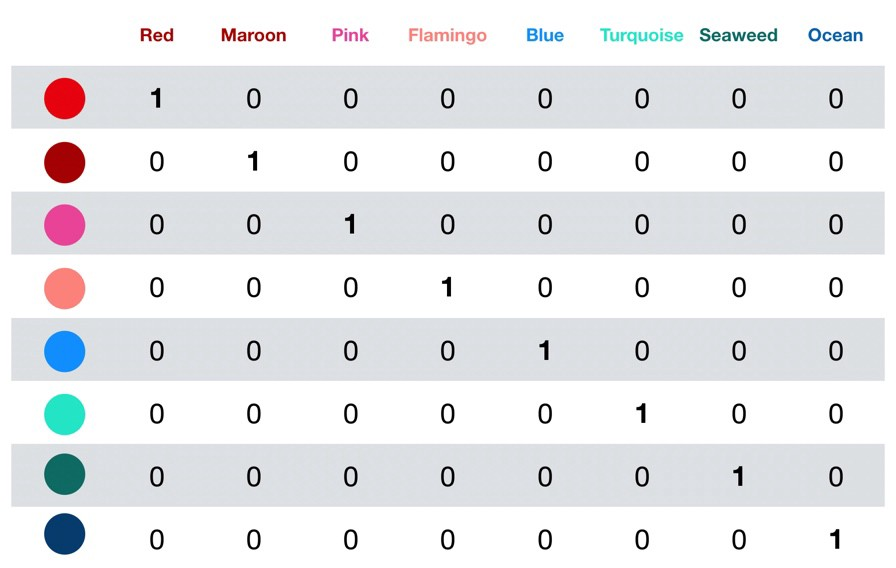

Now instead of 2 categories of colors, we have 8. How would a clustering algorithm likely interpret this? It would look at each candy and make the following conclusions:
* Every candy is its own color.
* As an algorithm (without special training), I do not know the relationships between colors. For example, unlike humans, I do not know that pink is closer to red than turquoise is.
* Given this set of features, I conclude that there are 8 clusters and they are all equally similar to each other.
* I also conclude that out of my 8 clusters, 4 are spicy and 4 are sweet.

That’s not useful at all. It is true that the candies are all different colors but this conclusion leaves us no better off than how we started. Read the last bullet again — it literally just restates what we already knew about our dataset. We have gained zero insight into how to predict whether a given candy will be spicy or sweet.

If we could take our high dimensional data and tranform it into lower dimensional data, we'd be able to spot what we did before.

### What can we use this for?

We have also talked about the curse of dimensionality regarding training models. Too many features and we pick up on noise. Too few features and we're unable to recognize signals in our data. Dimensionality reduction will allow us to do things like reduce features while preventing much of the loss of signals. 

Dimensionality reduction is most often used for:
* feature selection
* feature projection

### Feature Selection

Feature selection is the process of selecting features for use in models. 

We'd like:
* to simplify our models for easier interpretation
* shorter training times
* to avoid the curse of dimensionality
* to enhance generalization by reducing overfitting.

The central premise when using a feature selection technique is that the data contains some features that are either redundant or irrelevant and can be removed without incurring much loss of information. Redundant and irrelevant are two distinct notions, since one relevant feature may be redundant in the presence of another relevant feature with which it is strongly correlated.

source [wikipedia](https://en.wikipedia.org/wiki/Feature_selection)  
more information:  
https://machinelearningmastery.com/an-introduction-to-feature-selection/  
https://scikit-learn.org/stable/modules/feature_selection.html  
 

### Feature Extraction

Feature extraction is the process of reducing the number of resources required to describe a large set of data. When performing analysis of complex data one of the major problems stems from the number of variables involved. Analysis with a large number of variables generally requires a large amount of memory and computation power, also it may cause a classification algorithm to overfit to training samples and generalize poorly to new samples. Feature extraction is a general term for methods of constructing combinations of the variables to get around these problems while still describing the data with sufficient accuracy. Many machine learning practitioners believe that properly optimized feature extraction is the key to effective model construction.

Feature extraction aims to reduce the number of features by creating new features that summarize the old ones.

source [wikipedia](https://en.wikipedia.org/wiki/Feature_extraction)  
more information:  
https://towardsdatascience.com/feature-extraction-techniques-d619b56e31be
https://scikit-learn.org/stable/modules/feature_extraction.html  

### Principle Component Analysis

Principal component analysis (PCA) is an unsupervised linear transformation technique which is primarily used for feature extraction and dimensionality reduction. It aims to find the directions of maximum variance in high-dimensional data and projects the data onto a new subspace with equal or fewer dimensions than the original one. In the diagram given below, note the directions of maximum variance of data. This is represented using PCA1 (first maximum variance) and PC2 (2nd maximum variance).

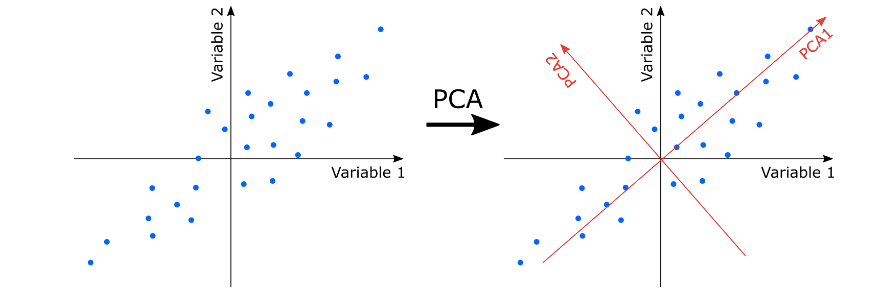

The following is taken from an excellent stackoverflow post  
https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues/140579#140579

*Imagine a big family dinner, where everybody starts asking you about PCA. First you explain it to your great-grandmother; then to you grandmother; then to your mother; then to your spouse; finally, to your daughter (who is a mathematician). Each time the next person is less of a layman. Here is how the conversation might go.*

**Great-grandmother: I heard you are studying "Pee-See-Ay". I wonder what that is...**

You: Ah, it's just a method of summarizing some data. Look, we have some wine bottles standing here on the table. We can describe each wine by its colour, by how strong it is, by how old it is, and so on (see this very nice visualization of wine properties taken from here). We can compose a whole list of different characteristics of each wine in our cellar. But many of them will measure related properties and so will be redundant. If so, we should be able to summarize each wine with fewer characteristics! This is what PCA does.

**Grandmother: This is interesting! So this PCA thing checks what characteristics are redundant and discards them?**

You: Excellent question, granny! No, PCA is not selecting some characteristics and discarding the others. Instead, it constructs some new characteristics that turn out to summarize our list of wines well. Of course these new characteristics are constructed using the old ones; for example, a new characteristic might be computed as wine age minus wine acidity level or some other combination like that (we call them linear combinations).

In fact, PCA finds the best possible characteristics, the ones that summarize the list of wines as well as only possible (among all conceivable linear combinations). This is why it is so useful.

**Mother: Hmmm, this certainly sounds good, but I am not sure I understand. What do you actually mean when you say that these new PCA characteristics "summarize" the list of wines?**

You: I guess I can give two different answers to this question. First answer is that you are looking for some wine properties (characteristics) that strongly differ across wines. Indeed, imagine that you come up with a property that is the same for most of the wines. This would not be very useful, would it? Wines are very different, but your new property makes them all look the same! This would certainly be a bad summary. Instead, PCA looks for properties that show as much variation across wines as possible.

The second answer is that you look for the properties that would allow you to predict, or "reconstruct", the original wine characteristics. Again, imagine that you come up with a property that has no relation to the original characteristics; if you use only this new property, there is no way you could reconstruct the original ones! This, again, would be a bad summary. So PCA looks for properties that allow to reconstruct the original characteristics as well as possible.

Surprisingly, it turns out that these two aims are equivalent and so PCA can kill two birds with one stone.

**Spouse: But darling, these two "goals" of PCA sound so different! Why would they be equivalent?**

You: Hmmm. Perhaps I should make a little drawing (takes a napkin and starts scribbling). Let us pick two wine characteristics, perhaps wine darkness and alcohol content -- I don't know if they are correlated, but let's imagine that they are. Here is what a scatter plot of different wines could look like:

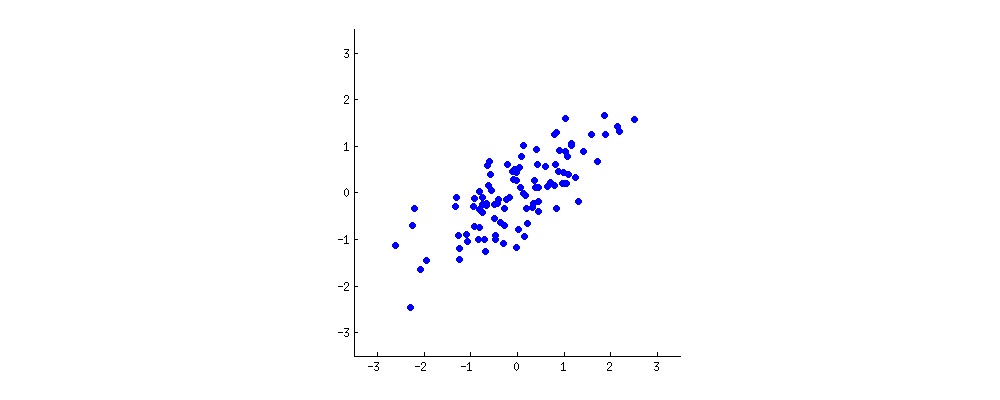

Each dot in this "wine cloud" shows one particular wine. You see that the two properties (x and y on this figure) are correlated. A new property can be constructed by drawing a line through the center of this wine cloud and projecting all points onto this line. This new property will be given by a linear combination $w_1x+w_2y$, where each line corresponds to some particular values of $w_1$ and $w_2$.

Now look here very carefully -- here is how these projections look like for different lines (red dots are projections of the blue dots):

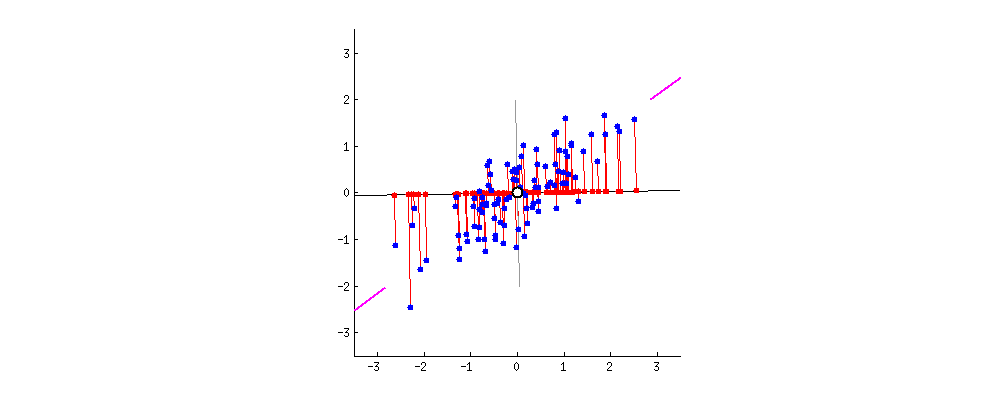

As I said before, PCA will find the "best" line according to two different criteria of what is the "best". First, the variation of values along this line should be maximal. Pay attention to how the "spread" (we call it "variance") of the red dots changes while the line rotates; can you see when it reaches maximum? Second, if we reconstruct the original two characteristics (position of a blue dot) from the new one (position of a red dot), the reconstruction error will be given by the length of the connecting red line. Observe how the length of these red lines changes while the line rotates; can you see when the total length reaches minimum?

If you stare at this animation for some time, you will notice that "the maximum variance" and "the minimum error" are reached at the same time, namely when the line points to the magenta ticks I marked on both sides of the wine cloud. This line corresponds to the new wine property that will be constructed by PCA.

By the way, PCA stands for "principal component analysis" and this new property is called "first principal component". And instead of saying "property" or "characteristic" we usually say "feature" or "variable".

**Daughter: Very nice, papa! I think I can see why the two goals yield the same result: it is essentially because of the Pythagoras theorem, isn't it? Anyway, I heard that PCA is somehow related to eigenvectors and eigenvalues; where are they on this picture?**

You: Brilliant observation. Mathematically, the spread of the red dots is measured as the average squared distance from the center of the wine cloud to each red dot; as you know, it is called the variance. On the other hand, the total reconstruction error is measured as the average squared length of the corresponding red lines. But as the angle between red lines and the black line is always 90∘
, the sum of these two quantities is equal to the average squared distance between the center of the wine cloud and each blue dot; this is precisely Pythagoras theorem. Of course this average distance does not depend on the orientation of the black line, so the higher the variance the lower the error (because their sum is constant). This hand-wavy argument can be made precise ([see here](https://stats.stackexchange.com/a/136072/28666)).

By the way, you can imagine that the black line is a solid rod and each red line is a spring. The energy of the spring is proportional to its squared length (this is known in physics as the Hooke's law), so the rod will orient itself such as to minimize the sum of these squared distances. I made a simulation of how it will look like, in the presence of some viscous friction:

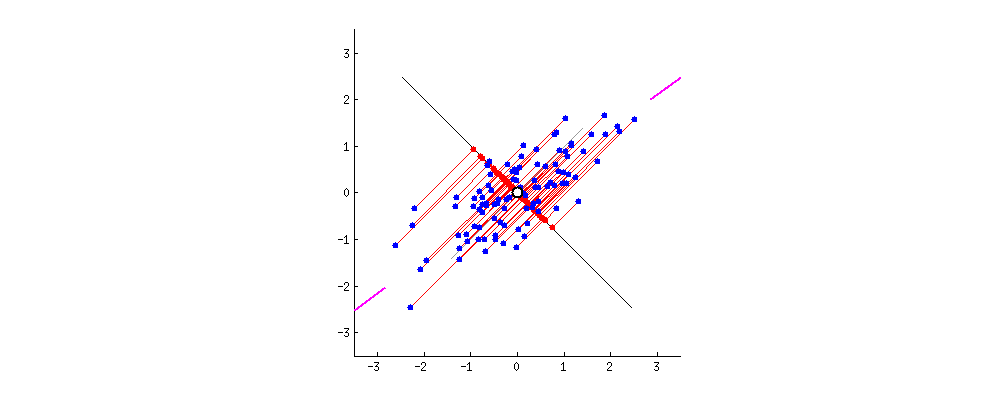

Regarding eigenvectors and eigenvalues. You know what a covariance matrix is; in my example it is a $2×2$ matrix that is given by

$$ \begin{pmatrix}
1.07 & 0.63 \\
0.63 & 0.64 \\
\end{pmatrix} $$.

What this means is that the variance of the $x$ variable is $1.07$, the variance of the $y$ variable is $0.64$, and the covariance between them is $0.63$. As it is a square symmetric matrix, it can be diagonalized by choosing a new orthogonal coordinate system, given by its eigenvectors (incidentally, this is called spectral theorem); corresponding eigenvalues will then be located on the diagonal. In this new coordinate system, the covariance matrix is diagonal and looks like that:

$$ \begin{pmatrix}
1.52 & 0 \\
0 & 0.19 \\
\end{pmatrix}$$,

meaning that the correlation between points is now zero. It becomes clear that the variance of any projection will be given by a weighted average of the eigenvalues (I am only sketching the intuition here). Consequently, the maximum possible variance $(1.52)$ will be achieved if we simply take the projection on the first coordinate axis. It follows that the direction of the first principal component is given by the first eigenvector of the covariance matrix. ([More details here.](https://stats.stackexchange.com/questions/217995/what-is-an-intuitive-explanation-for-how-pca-turns-from-a-geometric-problem-wit))

You can see this on the rotating figure as well: there is a gray line there orthogonal to the black one; together they form a rotating coordinate frame. Try to notice when the blue dots become uncorrelated in this rotating frame. The answer, again, is that it happens precisely when the black line points at the magenta ticks. Now I can tell you how I found them: they mark the direction of the first eigenvector of the covariance matrix, which in this case is equal to $(0.81,0.58)$.

PCA can be broken down into four steps:
1. We identify the relationship among features through a **Covariance Matrix**
2. Through the linear transformation or eigendecomposition of the Covariance Matrix, we get eigenvectors and eigenvalues.
3. Then we transform our data using Eigenvectors into principle components.
4. Lastly, we quantify the importance of these relationships using Eigenvalues and keep the important principal components.

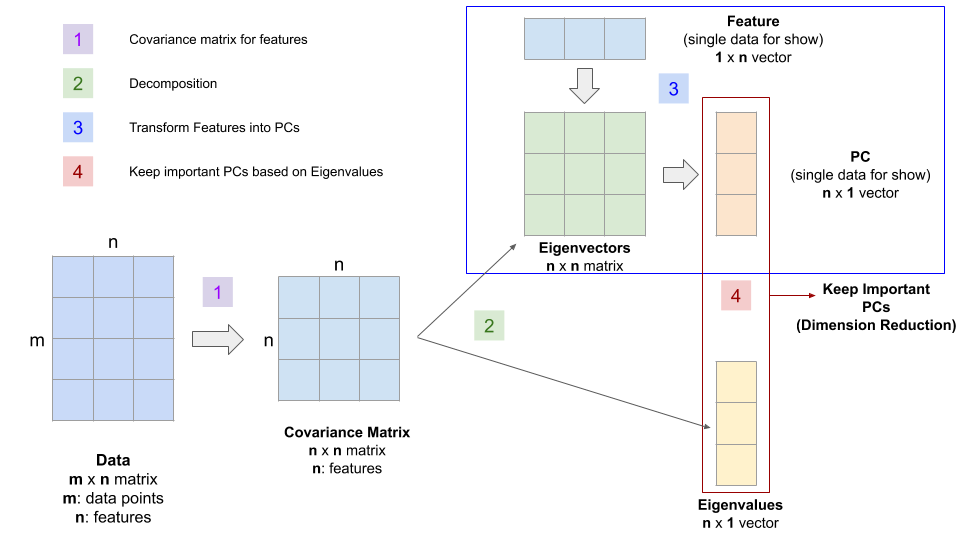
[source](https://towardsdatascience.com/feature-extraction-using-principal-component-analysis-a-simplified-visual-demo-e5592ced100a)

A Simplified Visual Demo

The following demo presents the linear transformation between features and principal components using eigenvectors for a single data point from the Iris database. I describe the calculations without using any linear algebra terms. However, it would be helpful if you understand the dot product between two vectors (since we demonstrate the transformation for a single data point) and matrix multiplication (when we transform all data points).

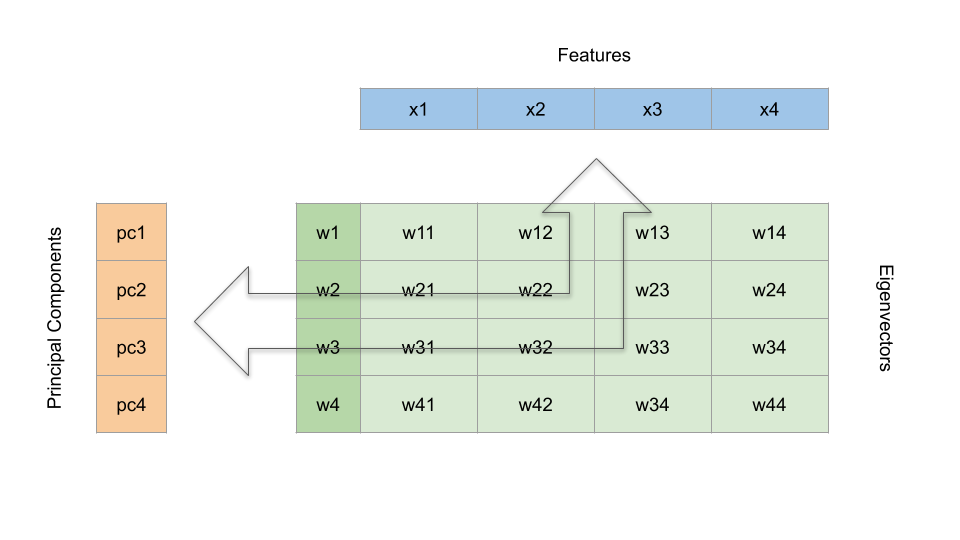

1. **Features:** represented by the blue horizontal on the top. Note that x1, x2, x3, and x4 represents the four features of a single iris (i.e., sepal length, sepal width, petal length, and petal width), not four different irises.
2. **Eigenvectors:** represented by green matrix
3. **Principal Components:** represented by the orange vertical bar to the left

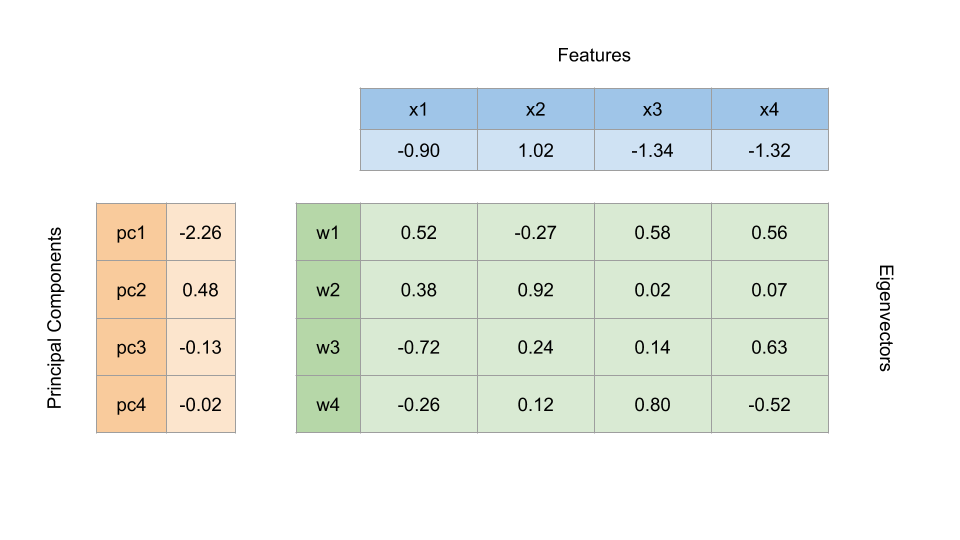

Figure 3 includes the values for each part. One of the best ways to learn and understand a mathematical method is to validate that the numbers add up. From here, we are going to do some simple calculations.

Visual Demo for Step 3

1. Transform Features into Principal Components.
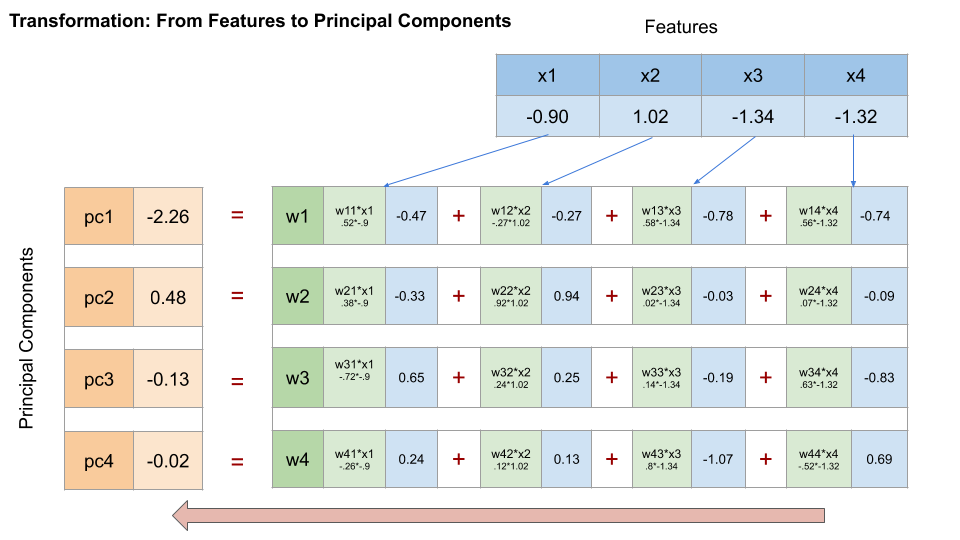

To transform the features into principal components, we multiply the features with the eigenvectors element by element, as shown in the figure above, and then add them in the horizontal direction.

2. Transform Princple Components back into Features.
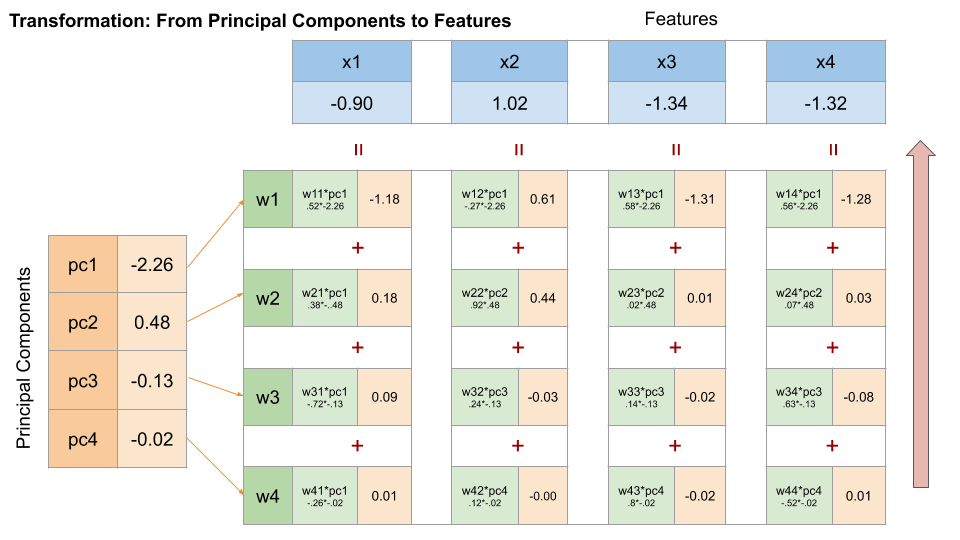

Well, you can certainly transform the principal components back into the original features by performing the calculation shown in the figure above.

Visual Demo for Step 4

After visualizaing the math behind the transformation, let's demonstrate the difference between feature elimination and feature extraction.

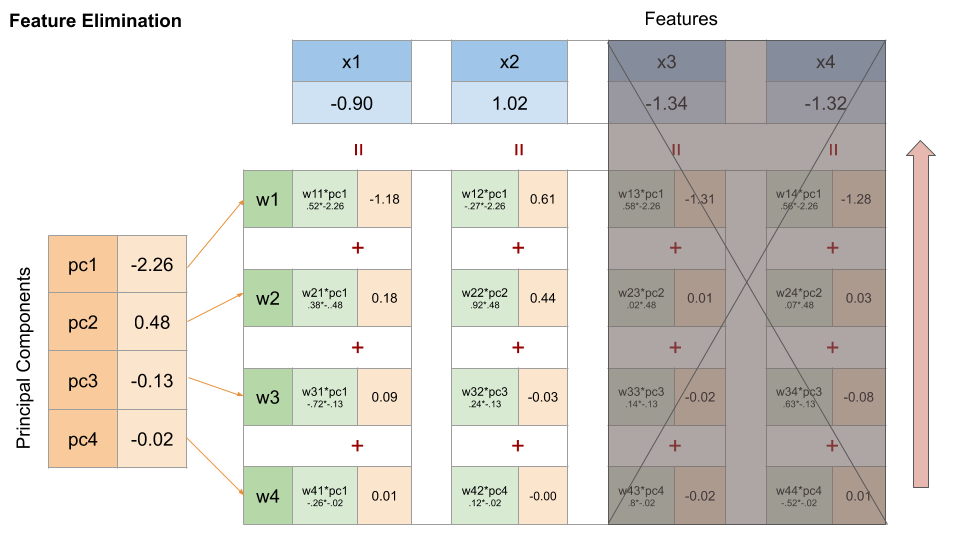

As shown in the figure above, if we choose to reduce dimensionality through feature elimination, we remove some features entirely, in this case, `x3` and `x4`. All information provided by petal length and petal width is lost when we reduce the dimension from 4 to 2.

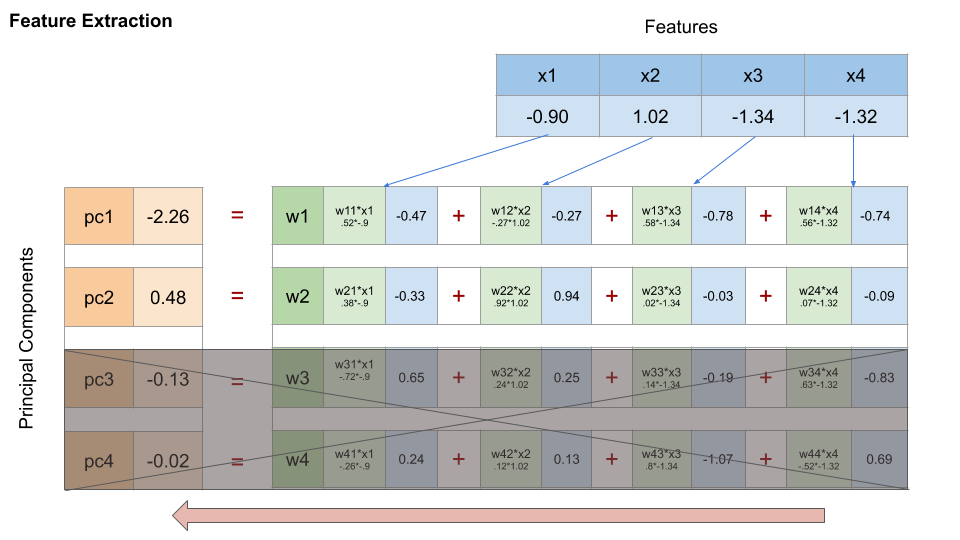

In contrast, when we reduce dimensionality through feature extraction methods such as PCA, we keep the most important information by selecting the principal components that explain most of the relationships among the features. Here is where the eigenvalues kick in and help us learn how much information each principal component contains.

In our case, the first and second principal components (i.e., pc1 and pc2) explained more than 95% of the variation from the features based on the normalized eigenvalue associated with each eigenvector, as shown in Figure 8 below. Therefore, we only keep pc1 and pc2.
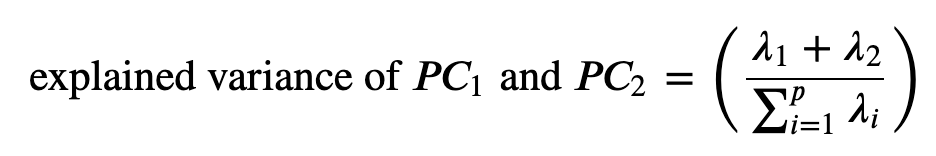

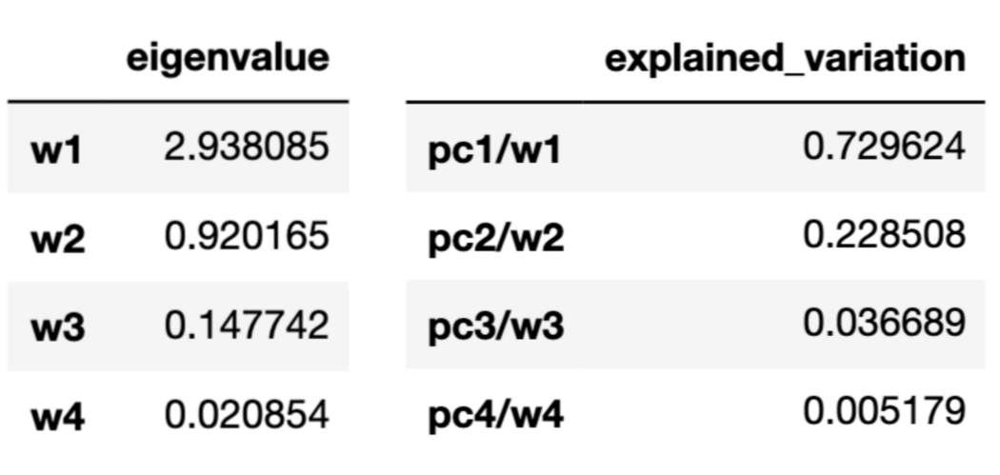

Note:
* that each of the principal components contains information from all four features. By keeping only `pc1` and `pc2`, we extract the most important information from all four features and reduce the dimension from 4 to 2.
* Data cleaning is important. PCA is sensitive to outliers and missing values
* Standardize data. PCA uses Euclidean distance as its feature vector similarity metric, so make sure we scale the features before applying PCA.
* Because we reduce dimensions and drop original features, we aren't able to interpret them and their impact.

**We'll be seeing an example of K-Means clustering using PCA.**

This journal article discusses the benefits of using the two together ([link](http://ranger.uta.edu/~chqding/papers/KmeansPCA1.pdf)) but in general, we can see benefits from utilizing PCA with some of our machine learning algorithms.

<div style="background: #000;
            color: #FFF;
            margin: 0px;
            margin-bottom: 10px;
            padding: 10px 0px 20px 0px;
            text-align: center; ">
    <h1>Neural Networks</h1> 
</div>

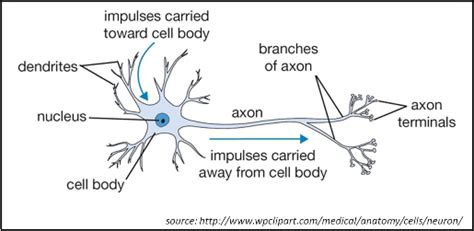

Neural networks, also known as artificial neural networks (ANNs) or simulated neural networks (SNNs), are a subset of machine learning and are at the heart of deep learning algorithms. Their name and structure are inspired by the human brain, mimicking the way that biological neurons signal to one another.

Artificial neural networks (ANNs) are comprised of a node layers, containing an input layer, one or more hidden layers, and an output layer. Each node, or artificial neuron, connects to another and has an associated weight and threshold. If the output of any individual node is above the specified threshold value, that node is activated, sending data to the next layer of the network. Otherwise, no data is passed along to the next layer of the network.

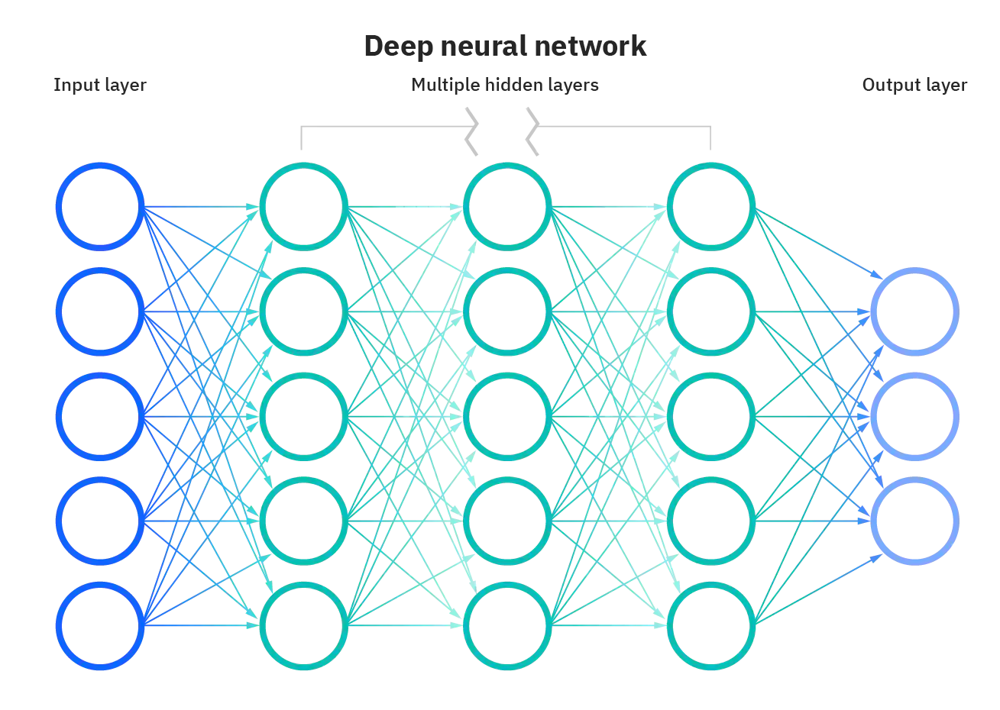

Neural networks rely on training data to learn and improve their accuracy over time. However, once these learning algorithms are fine-tuned for accuracy, they are powerful tools in computer science and artificial intelligence, allowing us to classify and cluster data at a high velocity. Tasks in speech recognition or image recognition can take minutes versus hours when compared to the manual identification by human experts. One of the most well-known neural networks is Google’s search algorithm.

source: [ibm](https://www.ibm.com/cloud/learn/neural-networks)

# Perceptrons

The perceptron algorithm was invented in 1958 by Frank Rosenblatt at the Cornell Aeronautical Laboratory. It was initially intended to be a machine however its first implementation was in software for the IBM 704.

A perceptron is an algorithm for supervised learning of binary classifers. A binary classifier is a function that can decide whether or not an input, represented by a vector of numbers, belongs to a specific class. It is a type of linear classifier (similar to logistic regressions) that makes predictions based on a linear predictor function combining a set of weights with the feature vector.

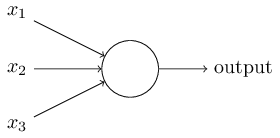

A perceptron is a threshold function, that maps its input $x$ to an output value $f(x)$. Essentially, a perceptron takes several binary inputs, $x_1, x_2,...$, and produces a single binary output.

$$ f(x)=\begin{cases}
1 & \text{if} \quad w\cdot x + b > 0\\
0 & \text{otherwise}\\
\end{cases}$$

where $w$ is a vector of real-valued weights, $w \cdot x$ is the dot product $\sum_{i=1}^{m}{w_ix_i}$ and $b$ is the bias

Similar to logistic regressions where we classified inputs into outputs if the result of the calculations were above a determined level, a perceptron will choose its binary output based on some level.

Below is an example of a learning algorithm for a single-layer perceptron. As more training examples are considered, the perceptron updates its linear boundary as it "learns".

### Perceptron Algorithm

Some definitions needed:
* `r` - Learning rate of perceptron. Between 0 and 1. Larger values make the weight changes more volatile
* $y=f(z)$ - denotes the output from the perceptron for an input vector $z$.
* $D = {(x_1,d_1),...,(x_s,d_s)}$ is the training set of $s$ samples, where:
  - $x_j$ is the $n$-dimensional input vector
  - $d_j$ is the desired output value of the perceptron for that input
* The values of the features are as follows:
  - $x_{j,i}$ denotes the $i$th feature of the $j$th training input vector
  - $x_{j,0} = 1$
* To represent the weights:
  - $w_i$ is the $i$the value in the weight vector, to be multiplied by the value of the $i$th input feature
  - because $x_{j,0}=1$, the $w_0$ is effectively a bias that we use instead of the bias constant $b$
* To show the time-dependence of $w$, we use:
  - $w_i(t)$, the weight $i$ at time $t$
  
Steps:
1. Initialize the weights and the threshold. Weights may be initialized to 0 or to a small random value. In the example below, we use 0.
2. For each example $j$ in our training set $D$, perform the following steps over the input $x_j$ and desired output $d_j$:
  a. Calculate the actual output:
  $$y_j(t) = f[w(t)\cdot x_j]$$
  $$y_j(t) = f[w_0(t)x_{j,0} + w_1(t)x_{j,1} +  w_2(t)x_{j,2} + ... +  w_n(t)x_{j,n}$$
  b. Update the weights:
    - $ w_i(t+1) = w_i(t) + r \cdot (d_j-y_j(t))x_{j,i}$ for all features
    - $ 0 <= i <= n$, $r$ is the learning rate

   x1  x2  y
0   0   0  0
1   0   1  1
2   1   0  1
3   1   1  1


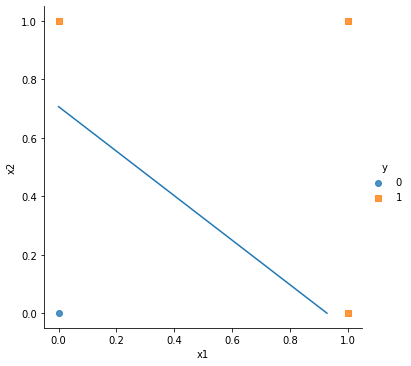

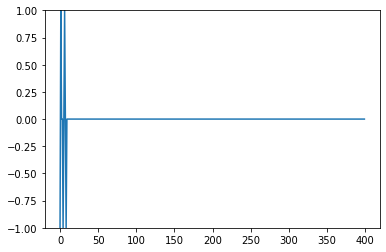

In [30]:
import random

r = 0.01
training_set = [((0,0), 0), ((0,1), 1), ((1,0), 1), ((1,1),1)]

x1 = [training_set[i][0][0] for i in range(len(training_set))]
x2 = [training_set[i][0][1] for i in range(len(training_set))]
y =  [training_set[i][1] for i in range(len(training_set))]

df = pd.DataFrame({
    'x1': x1,
    'x2': x2,
    'y' : y
})

sns.lmplot(x="x1", y="x2", data=df, fit_reg=False, hue="y", markers=['o', 's'])

print(df)

step_function = lambda x: 0 if x < 0 else 1

# set parameters
weights = np.random.rand(2)
errors = []
learning_rate = 0.3
epoch = 100
bias = 0

for i in range(epoch):
    for x, y in training_set:      
        # calculate output
        u = sum(x*weights) + bias
        
        # calculate error
        error = y - step_function(u) 
        errors.append(error) 
        
        # update weights and bias
        for index, value in enumerate(x):
            weights[index] += learning_rate * error * value
            bias += learning_rate*error
            
# final decision boundary
a = [0,-bias/weights[1]]
c = [-bias/weights[0],0]
plt.plot(a,c)
   
# ploting errors   
plt.figure(2)
plt.ylim([-1,1]) 
plt.plot(errors)
plt.show()

Issues with Perceptrons:
* Convergence - perceptrons are linear classifiers therefore it will not get to the state with all the input vectors classified correctly if the training set $D$ is not linearly separable. Meaning positive examples cannot be separated from negative examples by a hyperplane.

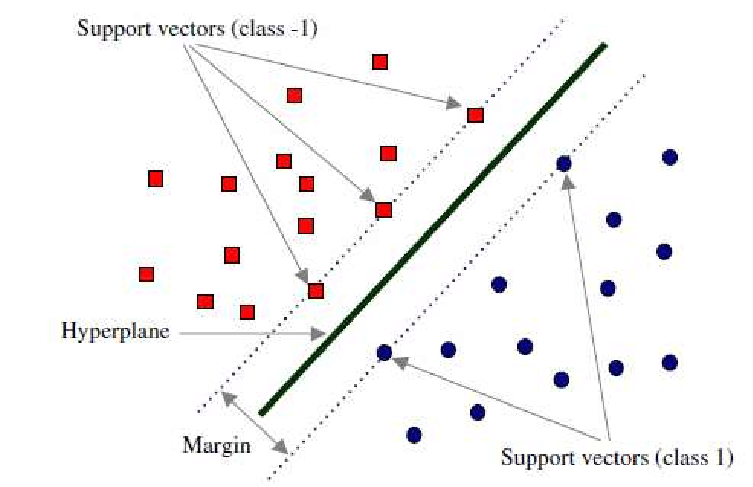

The reason why "support vector" is mentioned in the above image is because support vector machines were created to deal with the linearly separable constraint on perceptrons.

Required Reading:  
http://neuralnetworksanddeeplearning.com/chap1.html